<a href="https://colab.research.google.com/github/shwbak/HAI-Anomaly-Detection/blob/main/windowsize_10_F1_0_396.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

#SSH 키 발급

In [ ]:
!ssh-keygen

Generating public/private rsa key pair.
Enter file in which to save the key (/root/.ssh/id_rsa): ^C


In [ ]:
%cd ~/.ssh/

/root/.ssh


In [ ]:
! cat id_rsa.pub

cat: id_rsa.pub: No such file or directory


# Git 연동 확인

In [ ]:
!ssh-keyscan -t rsa github.com >> ~/.ssh/known_hosts

/bin/bash: /root/.ssh/known_hosts: No such file or directory


In [ ]:
!ssh -T git@github.com

Host key verification failed.


#구글드라이브 마운트(0)

In [ ]:
from google.colab import drive
drive.mount('/content/drive')

Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).


#Github Origin을 Pull

In [ ]:
from os.path import join
from os import makedirs

PROJ_path = "/content/drive/MyDrive/Colab Notebooks/"
%cd "{PROJ_path}"
try:
  makedirs("HAI-Anomaly-Detection")
  REPO_path = "/content/drive/MyDrive/Colab Notebooks/HAI-Anomaly-Detection/"
  %cd "{REPO_path}"
  !git init
  !git config --global user.email "minseok4864@ajou.ac.kr"
  !git config --global user.name "minseok4864"
  !git remote add origin https://github.com/shwbak/HAI-Anomaly-Detection

  !pip install --upgrade git-lfs

  !git lfs install
  !git lfs track "*.csv"
  !git add .gitattributes
except:
  print("동일한 이름의 폴더가 이미 존재합니다.")

/content/drive/MyDrive/Colab Notebooks
동일한 이름의 폴더가 이미 존재합니다.


Pull 코드

In [ ]:
REPO_path = "/content/drive/MyDrive/Colab Notebooks/HAI-Anomaly-Detection/"
%cd "{REPO_path}"

!pip install --upgrade git-lfs

!git init
!git config --global user.email "minseok4864@ajou.ac.kr"
!git config --global user.name "minseok4864"
!git pull origin main

/content/drive/MyDrive/Colab Notebooks/HAI-Anomaly-Detection
Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/
Reinitialized existing Git repository in /content/drive/MyDrive/Colab Notebooks/HAI-Anomaly-Detection/.git/
remote: Enumerating objects: 9, done.
remote: Counting objects: 100% (9/9), done.
remote: Compressing objects: 100% (6/6), done.
remote: Total 6 (delta 3), reused 0 (delta 0), pack-reused 0
Unpacking objects: 100% (6/6), 583.06 KiB | 383.00 KiB/s, done.
From https://github.com/shwbak/HAI-Anomaly-Detection
 * branch            main       -> FETCH_HEAD
   3a7da8b..7b4d434  main       -> origin/main
Updating 3a7da8b..7b4d434
Fast-forward
 ...54\232\251\355\225\234_Anomaly_Detection.ipynb" | 283 ++++++++++++++-------
 ...2\251\355\225\234_Anomaly_Detection_ipyn.ipynb" |  20 +-
 2 files changed, 208 insertions(+), 95 deletions(-)
fatal: cannot exec '.git/hooks/post-merge': Permission denied


#노이즈 제거(DWT) 데모 코드

In [ ]:
from skimage.restoration import denoise_wavelet

origin_Data = TRAIN_DF_RAW_01['C04'][:100]
TRAIN_DF_01_C01_DN = denoise_wavelet(origin_Data, method='BayesShrink')

plt.plot(origin_Data, label='Original data')
plt.plot(TRAIN_DF_01_C01_DN, label='Denoised data')
plt.legend()
plt.show()

NameError: ignored

#노이즈 제거(DWT) 데모 코드2

In [ ]:
from skimage.restoration import denoise_wavelet

def dataframe_DN(df):
  temp = pd.DataFrame(df)

  for colnam in VALID_COLUMNS_IN_TRAIN_DATASET[:3]:
    temp[colnam] = denoise_wavelet(df[colnam], method='BayesShrink',  sigma=0.1)
    #temp[colnam] = denoise_wavelet(df[colnam], method='VisuShrink', wavelet_levels=3, sigma=0.1)
  for colnam in VALID_COLUMNS_IN_TRAIN_DATASET[3:]:
    temp[colnam] = denoise_wavelet(df[colnam], method='BayesShrink',  sigma=0.4)
    #temp[colnam] = denoise_wavelet(df[colnam], method='VisuShrink', wavelet_levels=3, sigma=0.1) 
  return temp

In [ ]:
TRAIN_DF_01 = dataframe_DN(TRAIN_DF_01)

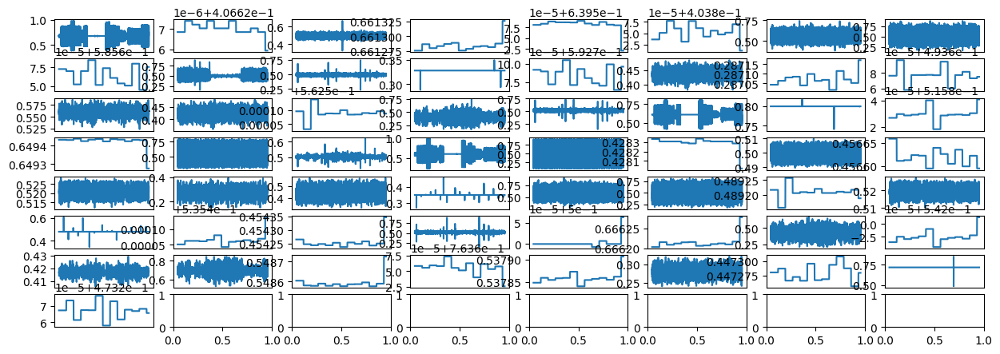

In [ ]:
fig, axs = plt.subplots(nrows=8, ncols=8, figsize=(15, 5))

for i, c in enumerate(VALID_COLUMNS_IN_TRAIN_DATASET):
  k = i // 8
  j = i % 8
  #axs[k, j].plot(TRAIN_DF_RAW_01[c], label='Original data')
  axs[k, j].plot(TRAIN_DF_02[c], label='Denoised data')
  axs[k, j].xaxis.set_visible(False)

plt.show()

In [ ]:
TRAIN_DF_02 = dataframe_DN(TRAIN_DF_02)
TRAIN_DF_03 = dataframe_DN(TRAIN_DF_03)
TRAIN_DF_04 = dataframe_DN(TRAIN_DF_04)
TRAIN_DF_05 = dataframe_DN(TRAIN_DF_05)
TRAIN_DF_06 = dataframe_DN(TRAIN_DF_06)

#노이즈 제거(지수평활법): 무시


In [ ]:
TRAIN_DF_01 = TRAIN_DF_01.ewm(alpha=0.9).mean()

In [ ]:
TRAIN_DF_02 = TRAIN_DF_02.ewm(alpha=0.9).mean()
TRAIN_DF_03 = TRAIN_DF_03.ewm(alpha=0.9).mean()
TRAIN_DF_04 = TRAIN_DF_04.ewm(alpha=0.9).mean()
TRAIN_DF_05 = TRAIN_DF_05.ewm(alpha=0.9).mean()
TRAIN_DF_06 = TRAIN_DF_06.ewm(alpha=0.9).mean()

In [ ]:
TRAIN_DF_01

# Raw 데이터 정규화: 무시

In [ ]:
# TRAIN_DF_01 = normalize(TRAIN_DF_01)
# TRAIN_DF_02 = normalize(TRAIN_DF_02)
# TRAIN_DF_03 = normalize(TRAIN_DF_03)
# TRAIN_DF_04 = normalize(TRAIN_DF_04)
# TRAIN_DF_05 = normalize(TRAIN_DF_05)
# TRAIN_DF_06 = normalize(TRAIN_DF_06)
TRAIN_DF_RAW = normalize(TRAIN_DF_RAW).ewm(alpha=0.9).mean()

In [ ]:
TRAIN_DF_RAW

,C01,C03,C04,C05,C06,C11,C12,C13,C14,C15,...,C74,C75,C76,C77,C78,C80,C81,C83,C84,C86
1,0.623110,0.406627,0.512145,0.665174,0.568582,0.411051,0.557070,0.404539,0.587413,0.5,...,0.533914,0.416907,0.692660,0.548586,0.764095,0.526600,0.279467,0.447279,0.715802,0.472720
2,0.593856,0.406627,0.483366,0.673849,0.649717,0.409359,0.556296,0.576890,0.584234,0.5,...,0.537811,0.417781,0.675663,0.544672,0.764455,0.523881,0.304028,0.447279,0.715802,0.473103
3,0.839631,0.406627,0.512196,0.671605,0.679225,0.408843,0.556226,0.526464,0.587098,0.5,...,0.543723,0.416128,0.694467,0.545873,0.765040,0.529024,0.293561,0.447279,0.715802,0.474579
4,0.516567,0.406627,0.491116,0.663417,0.643544,0.410197,0.556219,0.520269,0.585808,0.5,...,0.546932,0.416829,0.695404,0.549867,0.763717,0.533491,0.281215,0.447279,0.715802,0.472564
5,0.751644,0.406627,0.512321,0.661544,0.631165,0.408792,0.556219,0.432333,0.591972,0.5,...,0.547870,0.416899,0.682407,0.549485,0.768123,0.539637,0.304636,0.447279,0.715802,0.472022
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1004397,0.622515,0.406603,0.517420,0.661283,0.619693,0.403397,0.556357,0.505223,0.597409,0.5,...,0.541531,0.416907,0.683306,0.550661,0.763100,0.538313,0.273446,0.447279,0.715802,0.474294
1004398,0.628700,0.406625,0.489361,0.661283,0.627508,0.403039,0.556232,0.535769,0.567958,0.5,...,0.541987,0.416907,0.680493,0.544158,0.761588,0.537404,0.282597,0.447279,0.715802,0.471588
1004399,0.648043,0.406627,0.513596,0.661283,0.636565,0.403275,0.556220,0.486554,0.591761,0.5,...,0.542111,0.416907,0.677274,0.548914,0.762780,0.537872,0.266887,0.447279,0.715802,0.473137
1004400,0.684566,0.406627,0.487529,0.661187,0.657407,0.403933,0.556219,0.567748,0.592568,0.5,...,0.541306,0.416907,0.667857,0.548618,0.763135,0.537998,0.278888,0.447279,0.715802,0.472648


#그룹별 노이즈제거(DWT) (0-1)

중앙값

In [ ]:
from skimage.restoration import denoise_wavelet

def dataframe_DN(df):
  temp = pd.DataFrame(df)

  for colnam in [
      "C05",
      "C14",
      "C21",
      "C40",
      "C67",
      "C72",
      "C74",
      "C78",
      "C80"
  ]: 
    temp[colnam] = denoise_wavelet(df[colnam], method='BayesShrink',  sigma=0.006472222)
    #temp[colnam] = denoise_wavelet(df[colnam], method='VisuShrink', wavelet_levels=3, sigma=0.1)
  
  for colnam in [
      "C01",
      "C06",
      "C13",
      "C33",
      "C41",
      "C44",
      "C45",
      "C47",
      "C51"
  ]:
    temp[colnam] = denoise_wavelet(df[colnam], method='BayesShrink',  sigma=0.065394444)
    #temp[colnam] = denoise_wavelet(df[colnam], method='VisuShrink', wavelet_levels=3, sigma=0.1) 

  for colnam in [
      "C12",
      "C31",
      "C32",
      "C43",
      "C59",
      "C70",
      "C73",
      "C76",
      "C83"
  ]: 
    temp[colnam] = denoise_wavelet(df[colnam], method='BayesShrink',  sigma=0.016596875)
    #temp[colnam] = denoise_wavelet(df[colnam], method='VisuShrink', wavelet_levels=3, sigma=0.1)

  for colnam in [
      "C23",
      "C27",
      "C28",
      "C53",
      "C56",
      "C65",
      "C68",
      "C75",
      "C77",
      "C81"
  ]: 
    temp[colnam] = denoise_wavelet(df[colnam], method='BayesShrink',  sigma=0.03505)
    #temp[colnam] = denoise_wavelet(df[colnam], method='VisuShrink', wavelet_levels=3, sigma=0.1)
    
  for colnam in [
      "C03",
      "C04",
      "C11",
      "C24",
      "C25",
      "C30",
      "C42",
      "C50",
      "C54",
      "C60",
      "C62",
      "C71",
      "C86"
  ]: 
    temp[colnam] = denoise_wavelet(df[colnam], method='BayesShrink',  sigma=0.011921154)
    #temp[colnam] = denoise_wavelet(df[colnam], method='VisuShrink', wavelet_levels=3, sigma=0.1)
  
  return temp

In [ ]:
# TRAIN_DF_01 = dataframe_DN(TRAIN_DF_01)
# TRAIN_DF_02 = dataframe_DN(TRAIN_DF_02)
# TRAIN_DF_03 = dataframe_DN(TRAIN_DF_03)
# TRAIN_DF_04 = dataframe_DN(TRAIN_DF_04)
# TRAIN_DF_05 = dataframe_DN(TRAIN_DF_05)
# TRAIN_DF_06 = dataframe_DN(TRAIN_DF_06)
# TRAIN_DF_RAW = dataframe_DN(TRAIN_DF_RAW)

#그룹별 노이즈 제거(DTCWT) (0-2)

In [ ]:
!pip install dtcwt

Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/


In [ ]:
import numpy as np
import dtcwt
import matplotlib.pyplot as plt

def denoise_dtcwt(signal, threshold):
    if len(signal) % 2 != 0:
        signal = signal[:-1] 
    # Create a DTCWT object
    transform = dtcwt.Transform1d()

    # Perform the forward transform
    transformed = transform.forward(signal)

    # Thresholding on the high-pass coefficients
    #threshold = 0.03 # Adjust the threshold value as needed
    thresholded_highpasses = []
    for hp in transformed.highpasses:
        thresholded_hp = np.where(np.abs(hp) < threshold, 0, hp)
        thresholded_highpasses.append(thresholded_hp)

    # Create a new Pyramid object with the thresholded high-pass coefficients
    denoised_coeffs = dtcwt.Pyramid(transformed.lowpass, thresholded_highpasses)

    # Reconstruct the denoised signal using inverse DTCWT
    denoised = transform.inverse(denoised_coeffs)

    return denoised

중앙값

In [ ]:
from skimage.restoration import denoise_wavelet

def dataframe_DN(df):
  temp = pd.DataFrame(df)

  if len(df) % 2 == 0:
    temp = pd.DataFrame(df)
  else:
    temp = pd.DataFrame(df.iloc[:-1, :])
  #temp = pd.DataFrame(df.iloc[:-1, :])
  
  for colnam in [
      "C05",
      "C14",
      "C21",
      "C37",
      "C40",
      "C67",
      "C72",
      "C74",
      "C78",
      "C80"
  ]: 
    temp[colnam] = denoise_dtcwt(df[colnam], 0.0243)
    #temp[colnam] = denoise_wavelet(df[colnam], method='VisuShrink', wavelet_levels=3, sigma=0.1)
  
  for colnam in [
      "C01",
      "C06",
      "C13",
      "C33",
      "C41",
      "C44",
      "C45",
      "C47",
      "C51"
  ]:
    temp[colnam] = denoise_dtcwt(df[colnam], 0.069283333)
    #temp[colnam] = denoise_wavelet(df[colnam], method='VisuShrink', wavelet_levels=3, sigma=0.1) 

  for colnam in [
      "C12",
      "C31",
      "C32",
      "C43",
      "C59",
      "C70",
      "C73",
      "C76",
      "C83"
  ]: 
    temp[colnam] = denoise_dtcwt(df[colnam], 0.0292625)
    #temp[colnam] = denoise_wavelet(df[colnam], method='VisuShrink', wavelet_levels=3, sigma=0.1)

  for colnam in [
      "C16",
      "C23",
      "C27",
      "C28",
      "C53",
      "C56",
      "C65",
      "C66",
      "C68",
      "C75",
      "C77",
      "C81"
  ]: 
    temp[colnam] = denoise_dtcwt(df[colnam], 0.051905)
    #temp[colnam] = denoise_wavelet(df[colnam], method='VisuShrink', wavelet_levels=3, sigma=0.1)
    
  for colnam in [
      "C03",
      "C04",
      "C11",
      "C15",
      "C20",
      "C24",
      "C25",
      "C30",
      "C42",
      "C50",
      "C54",
      "C57",
      "C60",
      "C62",
      "C71",
      "C84",
      "C86"
  ]: 
    temp[colnam] = denoise_dtcwt(df[colnam], 0.031607692)
    #temp[colnam] = denoise_wavelet(df[colnam], method='VisuShrink', wavelet_levels=3, sigma=0.1)
  
  return temp

In [ ]:
# TRAIN_DF_01 = dataframe_DN(TRAIN_DF_01)
# TRAIN_DF_02 = dataframe_DN(TRAIN_DF_02)
# TRAIN_DF_03 = dataframe_DN(TRAIN_DF_03)
# TRAIN_DF_04 = dataframe_DN(TRAIN_DF_04)
# TRAIN_DF_05 = dataframe_DN(TRAIN_DF_05)
# TRAIN_DF_06 = dataframe_DN(TRAIN_DF_06)
# TRAIN_DF_RAW = dataframe_DN(TRAIN_DF_RAW)

#raw 데이터 준비 + 차분 (1)

In [ ]:
REPO_path = "/content/drive/MyDrive/Colab Notebooks/HAI-Anomaly-Detection/"
%cd "{REPO_path}"
!pip install eTaPR-21.8.2-py3-none-any.whl

/content/drive/MyDrive/Colab Notebooks/HAI-Anomaly-Detection
Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/
Processing ./eTaPR-21.8.2-py3-none-any.whl
eTaPR is already installed with the same version as the provided wheel. Use --force-reinstall to force an installation of the wheel.


In [ ]:
import gc
import pickle
import numpy as np
import pandas as pd
#import matplotlib.pyplot as plt
#import seaborn as sns
#import torch

import keras
from keras.callbacks import EarlyStopping, ModelCheckpoint
from keras.models import Model, Sequential, load_model
from keras.layers import Input,Bidirectional ,LSTM, Dense, Activation, GRU

import tensorflow as tf

from sklearn.metrics import mean_squared_error

#import numpy as np
#import pandas as pd
#from pathlib import Path
#from datetime import timedelta

#import dateutil
import matplotlib.pyplot as plt
from tqdm.notebook import trange
from TaPR_pkg import etapr

# def get_default_device():
#     if torch.cuda.is_available():
#         return torch.device('cuda')
#     else:
#         return torch.device('cpu')

# def to_device(data, device):
#     if isinstance(data, (list,tuple)):
#         return [to_device(x, device) for x in data]
#     return data.to(device, non_blocking=True)
    
# def plot_history(history):
#     losses = [x['val_loss'] for x in history]
#     plt.plot(losses, '-x', label="loss")
#     plt.xlabel('epoch')
#     plt.ylabel('loss')
#     plt.legend()
#     plt.title('Losses vs. No. of epochs')
#     plt.grid()
#     plt.show()

In [ ]:
# import torch.nn as nn

# device = get_default_device()


# class Autoencoder(nn.Module):
#     def __init__(self, in_size, latent_size):
#         super().__init__()
#         self.encoder = nn.Sequential(
#             nn.Linear(in_size, int(in_size/2)),
#             nn.ReLU(True),
#             nn.Linear(int(in_size/2), int(in_size/4)),
#             nn.ReLU(True),
#             nn.Linear(int(in_size/4), latent_size),
#             nn.ReLU(True)
#         )
#         self.decoder = nn.Sequential(
#             nn.Linear(latent_size, int(in_size/4)),
#             nn.ReLU(True),
#             nn.Linear(int(in_size/4), int(in_size/2)),
#             nn.ReLU(True),
#             nn.Linear(int(in_size/2), in_size),
#             nn.Sigmoid()
#         )
  
#     def training_step(self, batch, epoch):
#         z = self.encoder(batch)
#         out = self.decoder(z)
#         loss1 = nn.MSELoss()(out, batch)
#         loss2 = nn.L1Loss()(out, batch)
#         return loss1, loss2

#     def validation_step(self, batch, epoch):
#         z = self.encoder(batch)
#         out = self.decoder(z)
#         loss = nn.MSELoss()(out, batch)
#         return {'val_loss': loss}
        
#     def validation_epoch_end(self, outputs):
#         batch_losses = [x['val_loss'] for x in outputs]
#         epoch_loss = torch.stack(batch_losses).mean()
#         return {'val_loss': epoch_loss.item()}

#     def epoch_end(self, epoch, result):
#         print("Epoch [{}], val_loss: {:.4f}".format(epoch, result['val_loss']))


# def evaluate(model, val_loader, epoch):
#     outputs = [model.validation_step(to_device(batch, device), epoch) for [batch] in val_loader]
#     return model.validation_epoch_end(outputs)

# def training(epochs, model, train_loader, val_loader, opt_func=torch.optim.AdamW):
#     history = []
#     optimizer = opt_func(list(model.encoder.parameters()) + list(model.decoder.parameters()))
#     for epoch in range(epochs):
#         for [batch] in train_loader:
#             batch = to_device(batch, device)
#             loss1, loss2 = model.training_step(batch, epoch+1)
#             loss1.backward()
#             optimizer.step()
#             optimizer.zero_grad()
#         result = evaluate(model, val_loader, epoch + 1)
#         model.epoch_end(epoch, result)
#         history.append(result)
#     return history


# def testing(model, test_loader):
#     results = []
#     for [batch] in test_loader:
#         batch = to_device(batch, device)
#         z = model.encoder(batch)
#         reconstructed = model.decoder(z)
#         results.append(torch.mean((batch - reconstructed)**2, axis=1))
#     return results

In [ ]:
import sys

from pathlib import Path
from datetime import timedelta

import dateutil
#import numpy as np
#import matplotlib.pyplot as plt
#import pandas as pd
#import torch

from torch.utils.data import Dataset, DataLoader
from tqdm.notebook import trange
from TaPR_pkg import etapr
from tqdm import tqdm

In [ ]:
def dataframe_from_csv(target):
    return pd.read_csv(target).rename(columns=lambda x: x.strip())

def dataframe_from_csvs(targets):
    return pd.concat([dataframe_from_csv(x) for x in targets])

In [ ]:
TRAIN_DATASET = sorted([x for x in Path("/content/drive/MyDrive/Colab Notebooks/HAI-Anomaly-Detection/HAICon2021_dataset/train/").glob("*.csv")])
#TEST_DATASET = sorted([x for x in Path("/content/drive/MyDrive/Colab Notebooks/HAI-Anomaly-Detection/HAICon2021_dataset/test/").glob("*.csv")])
VALIDATION_DATASET = sorted([x for x in Path("/content/drive/MyDrive/Colab Notebooks/HAI-Anomaly-Detection/HAICon2021_dataset/validation/").glob("*.csv")])

In [ ]:
TRAIN_DF_RAW = dataframe_from_csvs(TRAIN_DATASET)
TRAIN_DF_RAW.reset_index(drop=True,inplace=True)

# TRAIN_DF_01 = dataframe_from_csv(TRAIN_DATASET[0])
# TRAIN_DF_01.reset_index(drop=True,inplace=True)

# TRAIN_DF_02 = dataframe_from_csv(TRAIN_DATASET[1])
# TRAIN_DF_02.reset_index(drop=True,inplace=True)

# TRAIN_DF_03 = dataframe_from_csv(TRAIN_DATASET[2])
# TRAIN_DF_03.reset_index(drop=True,inplace=True)

# TRAIN_DF_04 = dataframe_from_csv(TRAIN_DATASET[3])
# TRAIN_DF_04.reset_index(drop=True,inplace=True)

# TRAIN_DF_05 = dataframe_from_csv(TRAIN_DATASET[4])
# TRAIN_DF_05.reset_index(drop=True,inplace=True)

# TRAIN_DF_06 = dataframe_from_csv(TRAIN_DATASET[5])
# TRAIN_DF_06.reset_index(drop=True,inplace=True)

print(TRAIN_DF_RAW.shape)
#TRAIN_DF_RAW.head()

(1004402, 87)


In [ ]:
del [[TRAIN_DATASET]]

아래 두 목록에는 중복된 장치들이 있으니 이 점 유의하시면 좋을 것 같습니다.

변화가 없는 장치 목록
- C22, C52, C63, C82, C85, C55, C36, C26, C49, C38, C39, C29, C18, C19, C09

범주형 데이터 형태인 장치 목록
- C02, C07, C08, C09, C10, C17, C18, C19, C22, C26, C29, C34, C35, C36, C38, C39, C46, C48, C49, C52, C55, C58, C61, C63, C64, C69, C79, C82, C85

예측의 Loss 값이 튀는 경우를 없애주기 위해서 범주형 데이터의 경우 제외시켜주었습니다.

하지만 유의미한 결과를 보지는 못했던 것 같습니다.

In [ ]:
TIMESTAMP_FIELD = "timestamp"
DROP_FIELD = ["C02", "C07", "C08", "C09", "C10", "C17", "C18", "C19", "C22", "C26", "C29", "C34", "C35", "C36", "C38", "C39", "C46", "C48", "C49", "C52", "C55", "C58", "C61", "C63", "C64", "C69", "C79", "C82", "C85"]
IDSTAMP_FIELD = 'id'
ATTACK_FIELD = "attack"
# VALID_COLUMNS_IN_TRAIN_DATASET = TRAIN_DF_01.columns.drop([TIMESTAMP_FIELD])
VALID_COLUMNS_IN_TRAIN_DATASET = TRAIN_DF_RAW.columns.drop([TIMESTAMP_FIELD])
VALID_COLUMNS_IN_TRAIN_DATASET = VALID_COLUMNS_IN_TRAIN_DATASET.drop(DROP_FIELD)
VALID_COLUMNS_IN_TRAIN_DATASET

Index(['C01', 'C03', 'C04', 'C05', 'C06', 'C11', 'C12', 'C13', 'C14', 'C15',
       'C16', 'C20', 'C21', 'C23', 'C24', 'C25', 'C27', 'C28', 'C30', 'C31',
       'C32', 'C33', 'C37', 'C40', 'C41', 'C42', 'C43', 'C44', 'C45', 'C47',
       'C50', 'C51', 'C53', 'C54', 'C56', 'C57', 'C59', 'C60', 'C62', 'C65',
       'C66', 'C67', 'C68', 'C70', 'C71', 'C72', 'C73', 'C74', 'C75', 'C76',
       'C77', 'C78', 'C80', 'C81', 'C83', 'C84', 'C86'],
      dtype='object')

In [ ]:
tk = TRAIN_DF_RAW[TIMESTAMP_FIELD][1:]

In [ ]:
TAG_MIN = TRAIN_DF_RAW[VALID_COLUMNS_IN_TRAIN_DATASET].diff(1).dropna()[VALID_COLUMNS_IN_TRAIN_DATASET].min()
TAG_MAX = TRAIN_DF_RAW[VALID_COLUMNS_IN_TRAIN_DATASET].diff(1).dropna()[VALID_COLUMNS_IN_TRAIN_DATASET].max()

In [ ]:
def normalize(df):
    ndf = df.copy()
    for c in df.columns:
        if TAG_MIN[c] == TAG_MAX[c]:
            ndf[c] = df[c] - TAG_MIN[c]
        else:
            ndf[c] = (df[c] - TAG_MIN[c]) / (TAG_MAX[c] - TAG_MIN[c])
    return ndf

#노이즈 제거전 클러스터별 데이터 확인

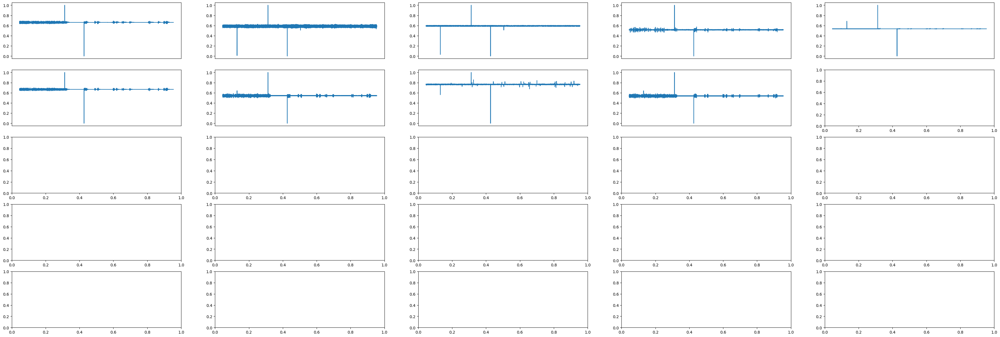

In [ ]:
# 노이즈 제거 전 클러스터 1
fig, axs = plt.subplots(nrows=5, ncols=5, figsize=(45, 15))

for i, c in enumerate([
      "C05",
      "C14",
      "C21",
      "C40",
      "C67",
      "C72",
      "C74",
      "C78",
      "C80"
]):
  k = i // 5
  j = i % 5
  axs[k, j].plot(normalize(TRAIN_DF_RAW[VALID_COLUMNS_IN_TRAIN_DATASET].diff(1).dropna())[c], label='Original data')
  axs[k, j].xaxis.set_visible(False)

plt.show()

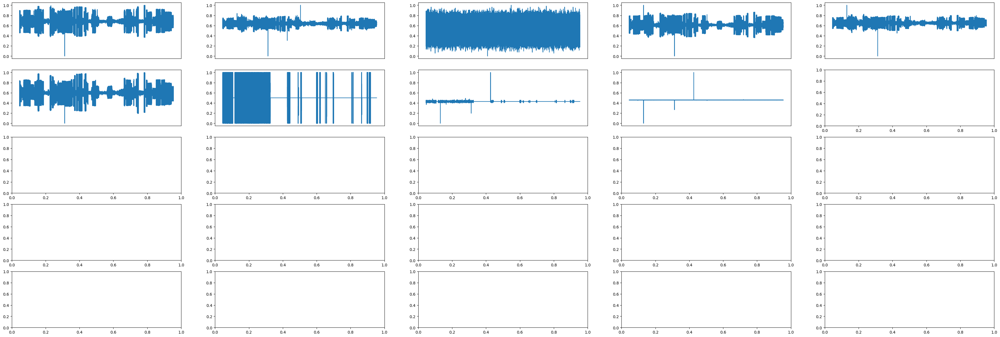

In [ ]:
# 노이즈 제거 전 클러스터2
fig, axs = plt.subplots(nrows=5, ncols=5, figsize=(45, 15))

for i, c in enumerate([
      "C01",
      "C06",
      "C13",
      "C33",
      "C41",
      "C44",
      "C45",
      "C47",
      "C51"
]):
  k = i // 5
  j = i % 5
  axs[k, j].plot(normalize(TRAIN_DF_RAW[VALID_COLUMNS_IN_TRAIN_DATASET].diff(1).dropna())[c], label='Original data')
  axs[k, j].xaxis.set_visible(False)

plt.show()

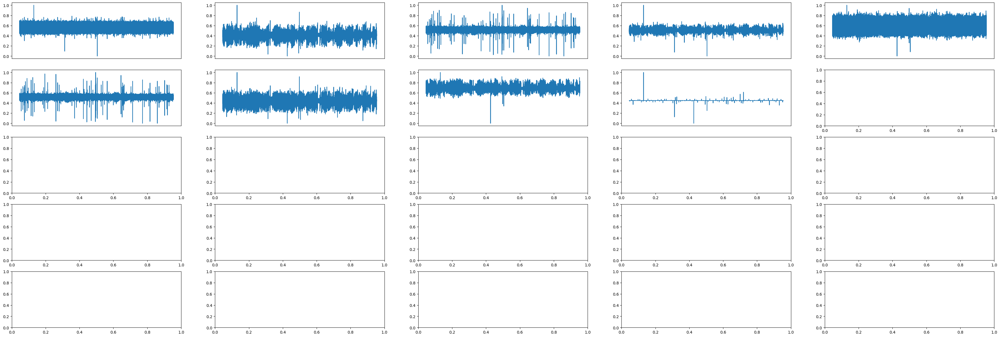

In [ ]:
# 노이즈 제거 전 클러스터3
fig, axs = plt.subplots(nrows=5, ncols=5, figsize=(45, 15))

for i, c in enumerate([
      "C12",
      "C31",
      "C32",
      "C43",
      "C59",
      "C70",
      "C73",
      "C76",
      "C83"
]):
  k = i // 5
  j = i % 5
  axs[k, j].plot(normalize(TRAIN_DF_RAW[VALID_COLUMNS_IN_TRAIN_DATASET].diff(1).dropna())[c], label='Original data')
  axs[k, j].xaxis.set_visible(False)

plt.show()

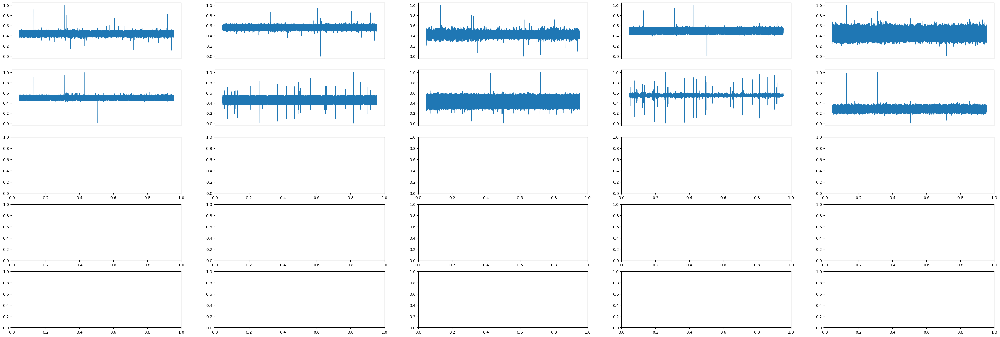

In [ ]:
# 노이즈 제거 전 클러스터4
fig, axs = plt.subplots(nrows=5, ncols=5, figsize=(45, 15))

for i, c in enumerate([
      "C23",
      "C27",
      "C28",
      "C53",
      "C56",
      "C65",
      "C68",
      "C75",
      "C77",
      "C81"
]):
  k = i // 5
  j = i % 5
  axs[k, j].plot(normalize(TRAIN_DF_RAW[VALID_COLUMNS_IN_TRAIN_DATASET].diff(1).dropna())[c], label='Original data')
  axs[k, j].xaxis.set_visible(False)

plt.show()

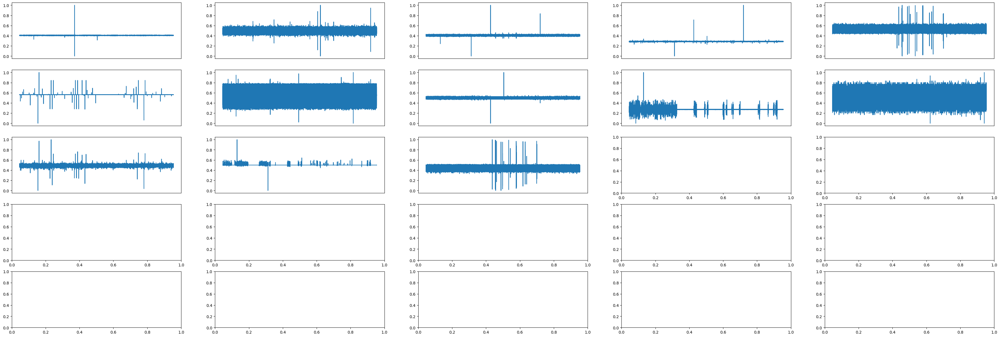

In [ ]:
# 노이즈 제거 전 클러스터5
fig, axs = plt.subplots(nrows=5, ncols=5, figsize=(45, 15))

for i, c in enumerate([
      "C03",
      "C04",
      "C11",
      "C24",
      "C25",
      "C30",
      "C42",
      "C50",
      "C54",
      "C60",
      "C62",
      "C71",
      "C86"
]):
  k = i // 5
  j = i % 5
  axs[k, j].plot(normalize(TRAIN_DF_RAW[VALID_COLUMNS_IN_TRAIN_DATASET].diff(1).dropna())[c], label='Original data')
  axs[k, j].xaxis.set_visible(False)

plt.show()

#노이즈 제거 (2)

In [ ]:
# TRAIN_DF_01 = TRAIN_DF_01[VALID_COLUMNS_IN_TRAIN_DATASET].diff(1).dropna()
# TRAIN_DF_02 = TRAIN_DF_02[VALID_COLUMNS_IN_TRAIN_DATASET].diff(1).dropna()
# TRAIN_DF_03 = TRAIN_DF_03[VALID_COLUMNS_IN_TRAIN_DATASET].diff(1).dropna()
# TRAIN_DF_04 = TRAIN_DF_04[VALID_COLUMNS_IN_TRAIN_DATASET].diff(1).dropna()
# TRAIN_DF_05 = TRAIN_DF_05[VALID_COLUMNS_IN_TRAIN_DATASET].diff(1).dropna()
# TRAIN_DF_06 = TRAIN_DF_06[VALID_COLUMNS_IN_TRAIN_DATASET].diff(1).dropna()
TRAIN_DF_RAW = dataframe_DN(normalize(TRAIN_DF_RAW[VALID_COLUMNS_IN_TRAIN_DATASET].diff(1).dropna()).ewm(alpha=0.9).mean())

In [ ]:
len(tk)

1004401

#노이즈 제거후 클러스터별 데이터 확인

In [ ]:
# TRAIN_DF_RAW_2 = dataframe_DN(TRAIN_DF_RAW)
# # 노이즈 제거 후
# fig, axs = plt.subplots(nrows=5, ncols=5, figsize=(45, 15))

# for i, c in enumerate([
#       "C03",
#       "C04",
#       "C11",
#       "C24",
#       "C25",
#       "C30",
#       "C42",
#       "C50",
#       "C54",
#       "C60",
#       "C62",
#       "C71",
#       "C86"
# ]):
#   k = i // 5
#   j = i % 5
#   axs[k, j].plot(TRAIN_DF_RAW_2[c], label='Original data')
#   axs[k, j].xaxis.set_visible(False)

# plt.show()

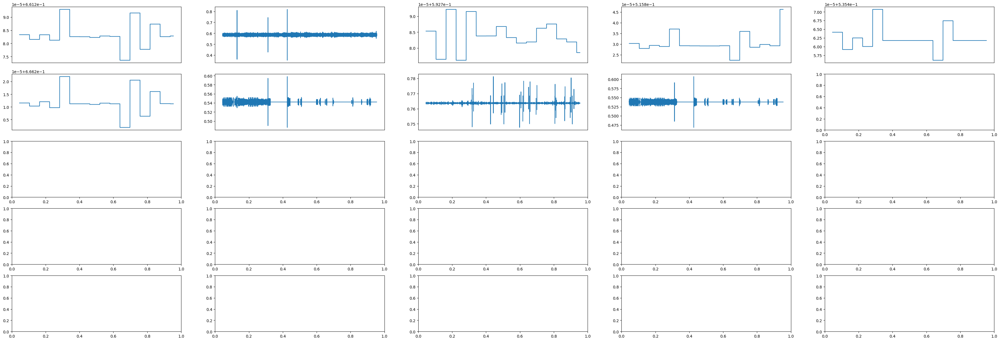

In [ ]:
# 노이즈 제거 후 클러스터 1
fig, axs = plt.subplots(nrows=5, ncols=5, figsize=(45, 15))

for i, c in enumerate([
      "C05",
      "C14",
      "C21",
      "C40",
      "C67",
      "C72",
      "C74",
      "C78",
      "C80"
]):
  k = i // 5
  j = i % 5
  axs[k, j].plot(TRAIN_DF_RAW[c], label='Original data')
  axs[k, j].xaxis.set_visible(False)

plt.show()

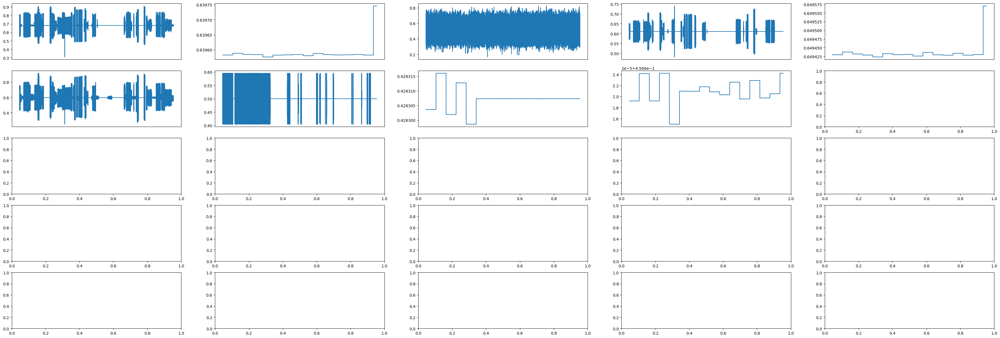

In [ ]:
# 노이즈 제거 후 클러스터2
fig, axs = plt.subplots(nrows=5, ncols=5, figsize=(45, 15))

for i, c in enumerate([
      "C01",
      "C06",
      "C13",
      "C33",
      "C41",
      "C44",
      "C45",
      "C47",
      "C51"
]):
  k = i // 5
  j = i % 5
  axs[k, j].plot(TRAIN_DF_RAW[c], label='Original data')
  axs[k, j].xaxis.set_visible(False)

plt.show()

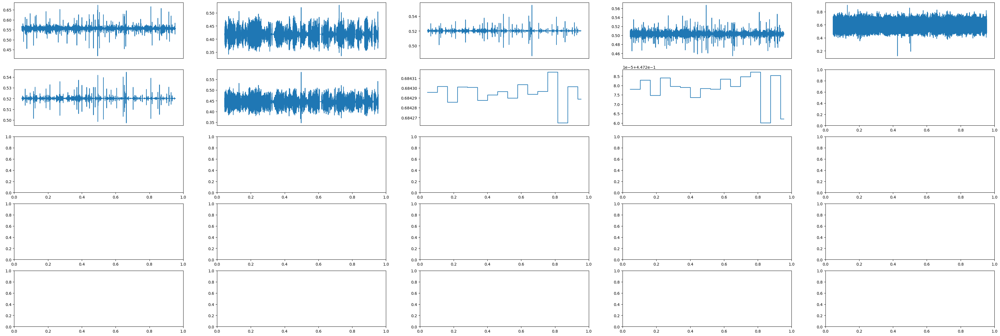

In [ ]:
# 노이즈 제거 후 클러스터3
fig, axs = plt.subplots(nrows=5, ncols=5, figsize=(45, 15))

for i, c in enumerate([
      "C12",
      "C31",
      "C32",
      "C43",
      "C59",
      "C70",
      "C73",
      "C76",
      "C83"
]):
  k = i // 5
  j = i % 5
  axs[k, j].plot(TRAIN_DF_RAW[c], label='Original data')
  axs[k, j].xaxis.set_visible(False)

plt.show()

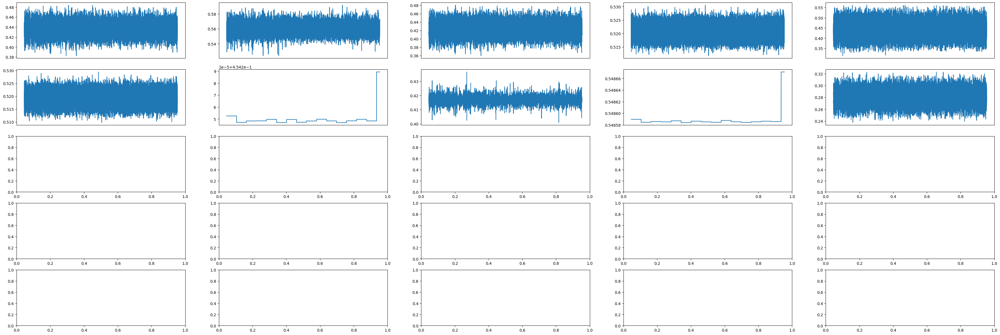

In [ ]:
# 노이즈 제거 후 클러스터4
fig, axs = plt.subplots(nrows=5, ncols=5, figsize=(45, 15))

for i, c in enumerate([
      "C23",
      "C27",
      "C28",
      "C53",
      "C56",
      "C65",
      "C68",
      "C75",
      "C77",
      "C81"
]):
  k = i // 5
  j = i % 5
  axs[k, j].plot(TRAIN_DF_RAW[c], label='Original data')
  axs[k, j].xaxis.set_visible(False)

plt.show()

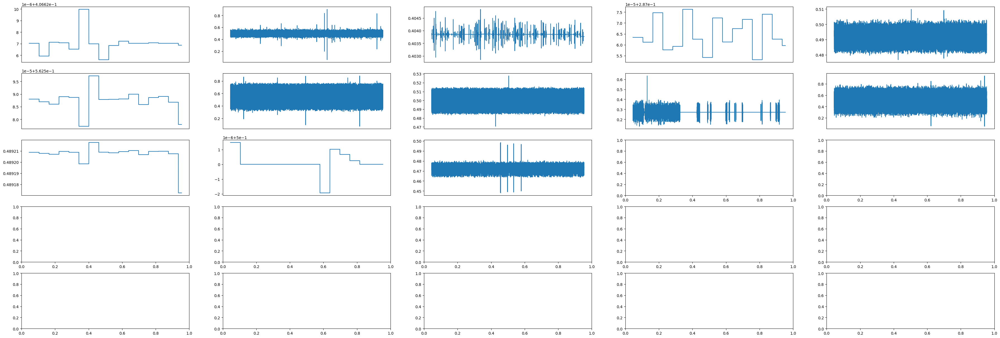

In [ ]:
# 노이즈 제거 후 클러스터5
fig, axs = plt.subplots(nrows=5, ncols=5, figsize=(45, 15))

for i, c in enumerate([
      "C03",
      "C04",
      "C11",
      "C24",
      "C25",
      "C30",
      "C42",
      "C50",
      "C54",
      "C60",
      "C62",
      "C71",
      "C86"
]):
  k = i // 5
  j = i % 5
  axs[k, j].plot(TRAIN_DF_RAW[c], label='Original data')
  axs[k, j].xaxis.set_visible(False)

plt.show()

#LSTM 모델(3)

In [ ]:
def HaiDataset(timestamps, df, stride=1, attacks=None):
    ts= np.array(timestamps)
    tag_values=np.array(df,dtype=np.float32)
    valid_idxs=[]
    for L in trange(len(ts)-WINDOW_SIZE+1):
        R = L + WINDOW_SIZE - 1
        if dateutil.parser.parse(ts[R]) - dateutil.parser.parse(ts[L]) == timedelta(seconds=WINDOW_SIZE - 1):
            valid_idxs.append(L)
    valid_idxs=np.array(valid_idxs, dtype=np.int32)[::stride]
    n_idxs = len(valid_idxs)
    print("# of valid windows:", n_idxs)
    if attacks is not None:
        attacks = np.array(attacks, dtype=np.float32)
        with_attack = True
    else:
        with_attack = False
        
    
    timestamp, X, y, att = list(), list(), list(), list()
    
    if with_attack:
        for i in valid_idxs:
            last=i+WINDOW_SIZE-1
            seq_time, seq_x, seq_y, seq_attack = ts[last], tag_values[i:i+WINDOW_GIVEN], tag_values[last], attacks[last]
            timestamp.append(seq_time)
            X.append(seq_x)
            y.append(seq_y)
            att.append(seq_attack)
            
        return np.array(timestamp), np.array(X), np.array(y), np.array(att)
    else:
        for i in valid_idxs:
            last=i+WINDOW_SIZE-1
            seq_time, seq_x, seq_y = ts[last], tag_values[i:i+WINDOW_GIVEN], tag_values[last]
            timestamp.append(seq_time)
            X.append(seq_x)
            y.append(seq_y)
        return np.array(timestamp), np.array(X), np.array(y)

In [ ]:
def fill_blank(check_ts, labels, total_ts):
    def ts_generator():
        for t in total_ts:
            yield dateutil.parser.parse(t)

    def label_generator():
        for t, label in zip(check_ts, labels):
            yield dateutil.parser.parse(t), label

    g_ts = ts_generator()
    g_label = label_generator()
    final_labels = []

    try:
        current = next(g_ts)
        ts_label, label = next(g_label)
        while True:
            if current >  ts_label:
                ts_label, label = next(g_label)
                continue
            elif current < ts_label:
                final_labels.append(0)
                current = next(g_ts)
                continue
            final_labels.append(label)
            current = next(g_ts)
            ts_label, label = next(g_label)
    except StopIteration:
        return np.array(final_labels, dtype=np.int8)

In [ ]:
VALIDATION_DF_RAW = dataframe_from_csvs(VALIDATION_DATASET)
#TEST_DF_RAW = dataframe_from_csvs(TEST_DATASET)

In [ ]:
#TRAIN_DF = normalize(TRAIN_DF_RAW[VALID_COLUMNS_IN_TRAIN_DATASET]).ewm(alpha=0.9).mean()
#TEST_DF = normalize(TEST_DF_RAW[VALID_COLUMNS_IN_TRAIN_DATASET].diff(1).dropna()).ewm(alpha=0.9).mean()
# VALIDATION_DF= normalize(VALIDATION_DF_RAW[VALID_COLUMNS_IN_TRAIN_DATASET].diff(1).dropna()).ewm(alpha=0.9).mean()

In [ ]:
## 35seq, 10seq, 50seq 학습 모델 생성
# 기본 모델은 35seq
# 10seq, 50seq는 추후 사용

WINDOW_SIZE= 10
WINDOW_GIVEN = WINDOW_SIZE - 1
if len(tk) == len(TRAIN_DF_RAW):
  ts, X_train, y_train = HaiDataset(tk, TRAIN_DF_RAW, stride=1)
else:
  ts, X_train, y_train = HaiDataset(tk[:-1], TRAIN_DF_RAW, stride=1)


aux_train=[]
for i in range(len(X_train)):
    aux_train.append(X_train[i][0])
aux_train=np.array(aux_train)

  0%|          | 0/1004392 [00:00<?, ?it/s]

# of valid windows: 1004347


In [ ]:
WINDOW_SIZE= 10
WINDOW_GIVEN = WINDOW_SIZE - 1
ts, X_valid, y_valid, attack = HaiDataset(VALIDATION_DF_RAW[TIMESTAMP_FIELD][1:],
                                          dataframe_DN(normalize(VALIDATION_DF_RAW[VALID_COLUMNS_IN_TRAIN_DATASET].diff(1).dropna()).ewm(alpha=0.9).mean()),
                                          attacks=VALIDATION_DF_RAW[ATTACK_FIELD][1:])

aux_valid=[]
for i in range(len(X_valid)):
    aux_valid.append(X_valid[i][0])
aux_valid=np.array(aux_valid)

  0%|          | 0/86390 [00:00<?, ?it/s]

# of valid windows: 86390


In [ ]:
## LSTM Model define

# 3층 양방향 LSTM 사용
# Hidden cell = 100
# Dropout 미사용
# Skip connection 사용

n_features = TRAIN_DF_RAW.shape[1]

#램 용량 관리를 위한 코드
del [[TRAIN_DF_RAW]]
# del [[VALIDATION_DF]]

In [ ]:
gc.collect()

18

In [ ]:
inputs=Input(shape=(WINDOW_GIVEN , n_features))
first=Bidirectional(LSTM(100, return_sequences=True))(inputs)
second=Bidirectional(LSTM(100, return_sequences=True))(first)
third=Bidirectional(LSTM(100))(second)

lstm_out=Dense(n_features)(third)

aux_input = Input(shape=(n_features,), name='aux_input')
outputs = keras.layers.add([lstm_out, aux_input])
model=Model(inputs=[inputs, aux_input], outputs=outputs)

model.compile(loss='mean_squared_error', optimizer='Adam')

model.summary()

Model: "model"
__________________________________________________________________________________________________
 Layer (type)                   Output Shape         Param #     Connected to                     
 input_1 (InputLayer)           [(None, 9, 57)]      0           []                               
                                                                                                  
 bidirectional (Bidirectional)  (None, 9, 200)       126400      ['input_1[0][0]']                
                                                                                                  
 bidirectional_1 (Bidirectional  (None, 9, 200)      240800      ['bidirectional[0][0]']          
 )                                                                                                
                                                                                                  
 bidirectional_2 (Bidirectional  (None, 200)         240800      ['bidirectional_1[0][0]']    

In [ ]:
# with open("X_train.pickle", "wb") as fp:   #Pickling
#    pickle.dump(X_train, fp)
# with open("aux_train.pickle", "wb") as fp:   #Pickling
#    pickle.dump(aux_train, fp)
# with open("y_train.pickle", "wb") as fp:   #Pickling
#    pickle.dump(y_train, fp)

In [ ]:
# with open("X_valid.pickle", "wb") as fp:   #Pickling
#    pickle.dump(X_valid, fp)
# with open("aux_valid.pickle", "wb") as fp:   #Pickling
#    pickle.dump(aux_valid, fp)
# with open("y_valid.pickle", "wb") as fp:   #Pickling
#    pickle.dump(y_valid, fp)


In [ ]:
# ## Load pickle
# with open("X_train.pickle","rb") as fr:
#     X_train = pickle.load(fr)
# with open("aux_train.pickle","rb") as fr:
#     aux_train = pickle.load(fr)
# ## Load pickle
# with open("y_train.pickle","rb") as fr:
#     y_train = pickle.load(fr)

# ## Load pickle
# with open("X_valid.pickle","rb") as fr:
#     X_valid = pickle.load(fr)
# with open("aux_valid.pickle","rb") as fr:
#     aux_valid = pickle.load(fr)
# ## Load pickle
# with open("y_valid.pickle","rb") as fr:
#     y_valid = pickle.load(fr)

In [ ]:
# 딥러닝 학습 및 추론에는 Keras를 사용
# 과적합 방지 적용
ModelName = './LSTM_35seq_test.h5'

# es = EarlyStopping(monitor='val_loss', mode='min', verbose=1, patience=10)
# mc = ModelCheckpoint(ModelName, monitor='val_loss', mode='min', verbose=1, save_best_only=True)

Epoch 1/40
1960/1962 [============================>.] - ETA: 0s - loss: 4.1950e-04
Epoch 1: val_loss improved from inf to 0.00071, saving model to ./LSTM_35seq_test.h5
1962/1962 [==============================] - 46s 15ms/step - loss: 4.1941e-04 - val_loss: 7.1206e-04
Epoch 2/40
1959/1962 [============================>.] - ETA: 0s - loss: 2.3633e-04
Epoch 2: val_loss improved from 0.00071 to 0.00057, saving model to ./LSTM_35seq_test.h5
1962/1962 [==============================] - 27s 14ms/step - loss: 2.3628e-04 - val_loss: 5.7124e-04
Epoch 3/40
1959/1962 [============================>.] - ETA: 0s - loss: 1.8787e-04
Epoch 3: val_loss improved from 0.00057 to 0.00052, saving model to ./LSTM_35seq_test.h5
1962/1962 [==============================] - 27s 14ms/step - loss: 1.8785e-04 - val_loss: 5.1999e-04
Epoch 4/40
1961/1962 [============================>.] - ETA: 0s - loss: 1.6606e-04
Epoch 4: val_loss did not improve from 0.00052
1962/1962 [==============================] - 27s 14ms/s

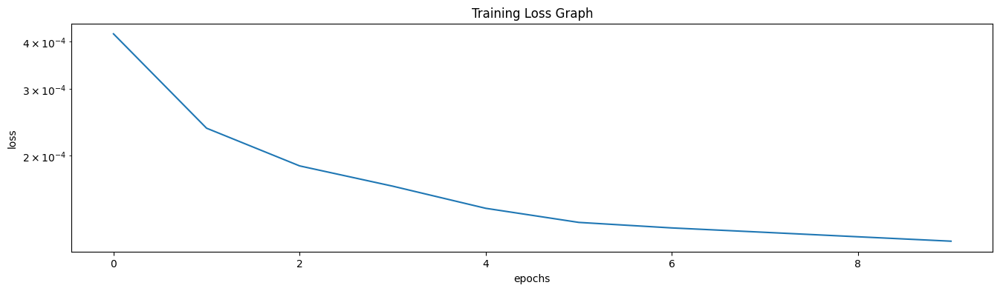

In [ ]:
hist=model.fit([X_train, aux_train], y_train, batch_size=512, epochs=40, shuffle=True, 
               callbacks=[EarlyStopping(monitor='val_loss', mode='min', verbose=1, patience=7),
               ModelCheckpoint(ModelName, monitor='val_loss', mode='min', verbose=1, save_best_only=True)],
               validation_data=([X_valid,aux_valid], y_valid))

plt.figure(figsize=(16, 4))
plt.title("Training Loss Graph")
plt.xlabel("epochs")
plt.ylabel("loss")
plt.yscale("log")
plt.plot(hist.history['loss'])
plt.show()

In [ ]:
# model = load_model('./LSTM_35seq_test.h5')

In [ ]:
## model load

WINDOW_SIZE= 10
WINDOW_GIVEN = WINDOW_SIZE - 1

#model = load_model('./LSTM_35seq_test.h5')

# 예측값 산출
y_pred=model.predict([X_valid,aux_valid])

2700/2700 [==============================] - 13s 4ms/step


In [ ]:
# 검증 데이터셋 전체 시간대에 해당하는 모든 필드의 (예측값 - 실제값)
tmp=[]
for i in range(len(y_pred)):
    tmp.append(abs(y_valid[i]-y_pred[i]))
    
    
ANOMALY_SCORE=np.mean(tmp,axis=1)

In [ ]:
print(ANOMALY_SCORE)

[0.00514402 0.00760203 0.00535984 ... 0.00363397 0.00318256 0.00294188]


In [ ]:
THRESHOLD = 0.015 

In [ ]:
def put_labels(distance, threshold):
    xs = np.zeros_like(distance)
    xs[distance > threshold] = 1
    return xs

In [ ]:
LABELS = put_labels(ANOMALY_SCORE, THRESHOLD)
LABELS, LABELS.shape

(array([0., 0., 0., ..., 0., 0., 0.], dtype=float32), (86390,))

In [ ]:
labels = [int(label!= 0 ) for label in VALIDATION_DF_RAW["attack"].values]

In [ ]:
TaPR = etapr.evaluate_haicon(anomalies=labels, predictions=LABELS)
print(f"F1: {TaPR['f1']:.3f} (TaP: {TaPR['TaP']:.3f}, TaR: {TaPR['TaR']:.3f})")
print(f"# of detected anomalies: {len(TaPR['Detected_Anomalies'])}")
print(f"Detected anomalies: {TaPR['Detected_Anomalies']}")

F1: 0.021 (TaP: 0.011, TaR: 0.234)
# of detected anomalies: 2
Detected anomalies: [<TaPR_pkg.DataManage.Range.Range object at 0x7f7e7eda0b50>, <TaPR_pkg.DataManage.Range.Range object at 0x7f7e7eda0a30>]


In [ ]:
def check_graph(xs, att, piece=2, THRESHOLD=None):
    l = xs.shape[0]
    chunk = l // piece
    fig, axs = plt.subplots(piece, figsize=(20, 4 * piece))
    for i in range(piece):
        L = i * chunk
        R = min(L + chunk, l)
        xticks = range(L, R)
        axs[i].plot(xticks, xs[L:R])
        if len(xs[L:R]) > 0:
            peak = np.max(xs[L:R])
            axs[i].plot(xticks, att[L:R] * np.array(peak) * np.array(0.3))
        if THRESHOLD!=None:
            axs[i].axhline(y=THRESHOLD, color='r')
    plt.show()

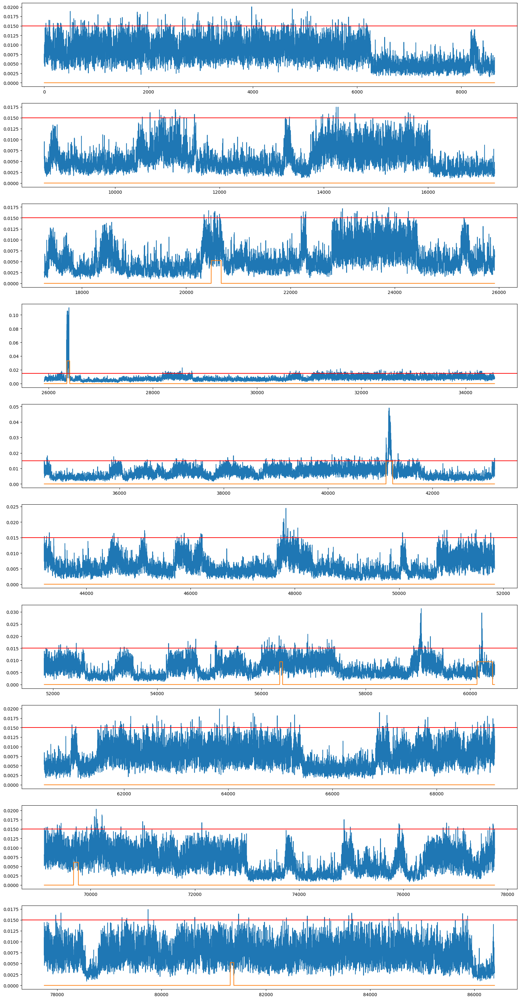

In [ ]:
check_graph(ANOMALY_SCORE, labels, piece=10, THRESHOLD=THRESHOLD)

#후처리(4)

In [ ]:
# 가중치를 조절한 Moving Average 사용
ANOMALY_SCORE_2 = np.array(ANOMALY_SCORE)
wMA10=[]
for idx in range(len(ANOMALY_SCORE_2)):
    if idx >= 10:
        wMA10.append((ANOMALY_SCORE_2[idx-10:idx].mean()*9+ANOMALY_SCORE_2[idx])/10)
    else:
        wMA10.append(ANOMALY_SCORE_2[idx])

wMA10=np.array(wMA10)
print(wMA10.shape)

(86390,)


In [ ]:
LABELS_MA = put_labels(wMA10, THRESHOLD)
print(len(LABELS_MA), sum(LABELS_MA))

86390 182.0


In [ ]:
len(ts)

86390

In [ ]:
FINAL_LABELS_MA = fill_blank(ts, LABELS_MA, np.array(VALIDATION_DF_RAW[TIMESTAMP_FIELD]))
print(len(FINAL_LABELS_MA), sum(FINAL_LABELS_MA))

86400 182


In [ ]:
# anomaly score가 미세한 차이로 threshold를 넘나드는 경우, 짧은 시간동안 오탐/미탐이 발생
# 탐지된 공격의 시간을 기준으로 정상과 anomaly를 판단하는 정책 적용
import copy
def Gray_Area(attacks):
    n_attacks = copy.deepcopy(attacks)
    for k in range(3):
        start = []   # start point
        finish = []  # finish point
        com = 0         # 처음에만 적용
        count = 0       # 연속된 수 카운트
        c = []          # 카운트 저장
        
        for i in range(1, len(n_attacks)):   # 라벨 파악
            if com == 0:                         # 처음에만 적용
                start.append(i)
                count = count + 1
                com = 1
            elif n_attacks[i - 1] != n_attacks[i]:  # 변화 발생
                finish.append(i - 1)
                c.append(count)
                count = 0
                start.append(i)
                count = count + 1
            else:                                # 카운트 (변화x)
                count = count + 1

        finish.append(len(n_attacks) - 1)
        c.append(finish[len(finish) - 1] - start[len(start) - 1] + 1)
        
        if k == 0:
            for i in range(0, len(start)):
                if c[i] < 100:
                    s = start[i]
                    f = finish[i] + 1

                    if n_attacks[start[i] - 1] == 1:
                        g1 = [1 for i in range(c[i])]
                        n_attacks[s:f] = g1
            
        elif k == 1:
            for i in range(0, len(start)):
                if c[i] < 10:
                    s = start[i]
                    f = finish[i] + 1

                    if n_attacks[start[i] - 1] == 0:
                        g0 = [0 for i in range(c[i])]
                        n_attacks[s:f] = g0
    
    return n_attacks

In [ ]:
# NewGray 적용

gray_LABELS=Gray_Area(FINAL_LABELS_MA)
print(gray_LABELS.shape, sum(gray_LABELS))

(86400,) 204


In [ ]:
pro_LABELS = list(gray_LABELS)

PRO_WINDOW_SIZE = 30

for i in range(PRO_WINDOW_SIZE, len(pro_LABELS)):
    if 1 <= sum(pro_LABELS[i-PRO_WINDOW_SIZE:i]):
        pro_LABELS[i-PRO_WINDOW_SIZE] = 1
    else:
        pro_LABELS[i-PRO_WINDOW_SIZE] = 0
        
print(sum(pro_LABELS))

320


In [ ]:
TaPR = etapr.evaluate_haicon(anomalies=labels, predictions=pro_LABELS)
print("Validation / THRESHOLD: " + str(THRESHOLD) + " / wMA10")
print(f"F1: {TaPR['f1']:.3f} (TaP: {TaPR['TaP']:.3f}, TaR: {TaPR['TaR']:.3f})")
print(f"# of detected anomalies: {len(TaPR['Detected_Anomalies'])}")

Validation / THRESHOLD: 0.015 / wMA10
F1: 0.396 (TaP: 0.587, TaR: 0.299)
# of detected anomalies: 3


In [ ]:
len(wMA10)

86390

In [ ]:
len(labels)

86400

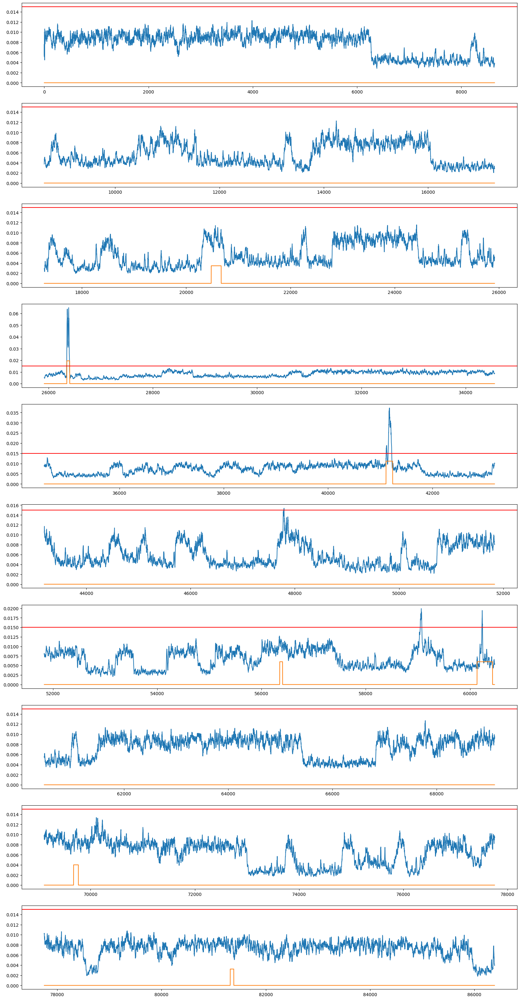

In [ ]:
check_graph(wMA10, labels, piece=10, THRESHOLD = THRESHOLD)

#테스트 csv 생성

In [ ]:
# 같은 방식으로 Test set에 적용
TEST_DATASET = sorted([x for x in Path("/content/drive/MyDrive/Colab Notebooks/HAI-Anomaly-Detection/HAICon2021_dataset/test/").glob("*.csv")])
TEST_DF_RAW = dataframe_from_csvs(TEST_DATASET)
TEST_DF = normalize(TEST_DF_RAW[VALID_COLUMNS_IN_TRAIN_DATASET].diff(1).dropna()).ewm(alpha=0.9).mean()

WINDOW_SIZE= 35
WINDOW_GIVEN = WINDOW_SIZE - 1

CHECK_TS, X_test, y_test = HaiDataset(TEST_DF_RAW[TIMESTAMP_FIELD][1:], TEST_DF, attacks=None)

aux_test=[]
for i in range(len(X_test)):
    aux_test.append(X_test[i][0])
aux_test=np.array(aux_test)

  0%|          | 0/274765 [00:00<?, ?it/s]

# of valid windows: 274697


In [ ]:
y_pred=model.predict([X_test,aux_test])

8585/8585 [==============================] - 52s 6ms/step


In [ ]:
tmp=[]
for i in range(len(y_test)):
    tmp.append(abs(y_test[i]-y_pred[i]))
    
ANOMALY_SCORE=np.mean(tmp,axis=1)

In [ ]:
## Moving Average

wMA10=[]
for idx in range(len(ANOMALY_SCORE)):
    if idx >= 10:
        wMA10.append((ANOMALY_SCORE[idx-10:idx].mean()*9+ANOMALY_SCORE[idx])/10)
    else:
        wMA10.append(ANOMALY_SCORE[idx])

wMA10=np.array(wMA10)
print(wMA10.shape)

(274697,)


In [ ]:
### Threshold Setting

THRESHOLD = 0.025

test_LABELS = put_labels(wMA10, THRESHOLD)
print(len(test_LABELS), sum(test_LABELS))

274697 1281.0


In [ ]:
FINAL_LABELS = fill_blank(CHECK_TS, test_LABELS, np.array(TEST_DF_RAW[TIMESTAMP_FIELD]))
print(len(FINAL_LABELS), sum(FINAL_LABELS))

274800 1281


In [ ]:
# NewGray 적용

gray_LABELS=Gray_Area(FINAL_LABELS)
gray_LABELS.shape, sum(gray_LABELS)

((274800,), 1683)

In [ ]:
pro_LABELS = list(gray_LABELS)

PRO_WINDOW_SIZE = 30

for i in range(PRO_WINDOW_SIZE, len(pro_LABELS)):
    if 1 <= sum(pro_LABELS[i-PRO_WINDOW_SIZE:i]):

        pro_LABELS[i-PRO_WINDOW_SIZE] = 1
    else:
        pro_LABELS[i-PRO_WINDOW_SIZE] = 0
        
print(sum(pro_LABELS))

2292


In [ ]:
submission = pd.read_csv('./sample_submission.csv')
submission.index = submission[TIMESTAMP_FIELD]

In [ ]:
len(submission[TIMESTAMP_FIELD])

274800

In [ ]:
submission['attack'] = pro_LABELS

In [ ]:
SaveFileName = './LSTM(35)_0.009.csv'

submission.to_csv(SaveFileName, index=False)
print(SaveFileName + ' ------ Save Completed ------\n\n')

./LSTM(35)_0.009.csv ------ Save Completed ------




#Val데이터 확인

In [ ]:
def check_graph2(xs, att, piece=2, THRESHOLD=None):
    l = xs.shape[0]
    chunk = l // piece
    fig, axs = plt.subplots(piece, figsize=(20, 4 * piece))
    for i in range(piece):
        L = i * chunk
        R = min(L + chunk, l)
        xticks = range(L, R)
        axs[i].plot(xticks, xs[L:R])
        if len(xs[L:R]) > 0:
            peak = np.max(xs[L:R])
            axs[i].plot(xticks, att[L:R] * np.array(peak) * np.array(0.3))
        if THRESHOLD!=None:
            axs[i].axhline(y=THRESHOLD, color='r')
    plt.show()

In [ ]:
TAG_MIN_2 = VALIDATION_DF.min()
TAG_MAX_2 = VALIDATION_DF.max()

def normalize_2(df,colu):
  ndf = df.copy()
  for c in colu:
      if TAG_MIN_2[c] == TAG_MAX_2[c]:
          ndf[c] = df[c] - TAG_MIN_2[c]
      else:
          ndf[c] = (df[c] - TAG_MIN_2[c]) / (TAG_MAX_2[c] - TAG_MIN_2[c])
  return ndf[colu]

In [ ]:
normalize_2(VALIDATION_DF,['C05'])

,C05
1,0.494610
2,0.404039
3,0.519293
4,0.545361
5,0.541068
...,...
86395,0.540591
86396,0.540591
86397,0.540591
86398,0.540591


In [ ]:
VALIDATION_DF["C37"]

1        0.799303
2        0.799303
3        0.799303
4        0.799303
5        0.799303
           ...   
86395    0.799303
86396    0.799303
86397    0.799303
86398    0.799303
86399    0.799303
Name: C37, Length: 86399, dtype: float64

/usr/local/lib/python3.10/dist-packages/numpy/core/fromnumeric.py:84: FutureWarning: In a future version, DataFrame.max(axis=None) will return a scalar max over the entire DataFrame. To retain the old behavior, use 'frame.max(axis=0)' or just 'frame.max()'
  return reduction(axis=axis, out=out, **passkwargs)
/usr/local/lib/python3.10/dist-packages/numpy/core/fromnumeric.py:84: FutureWarning: In a future version, DataFrame.max(axis=None) will return a scalar max over the entire DataFrame. To retain the old behavior, use 'frame.max(axis=0)' or just 'frame.max()'
  return reduction(axis=axis, out=out, **passkwargs)
/usr/local/lib/python3.10/dist-packages/numpy/core/fromnumeric.py:84: FutureWarning: In a future version, DataFrame.max(axis=None) will return a scalar max over the entire DataFrame. To retain the old behavior, use 'frame.max(axis=0)' or just 'frame.max()'
  return reduction(axis=axis, out=out, **passkwargs)
/usr/local/lib/python3.10/dist-packages/numpy/core/fromnumeric.py:84: 

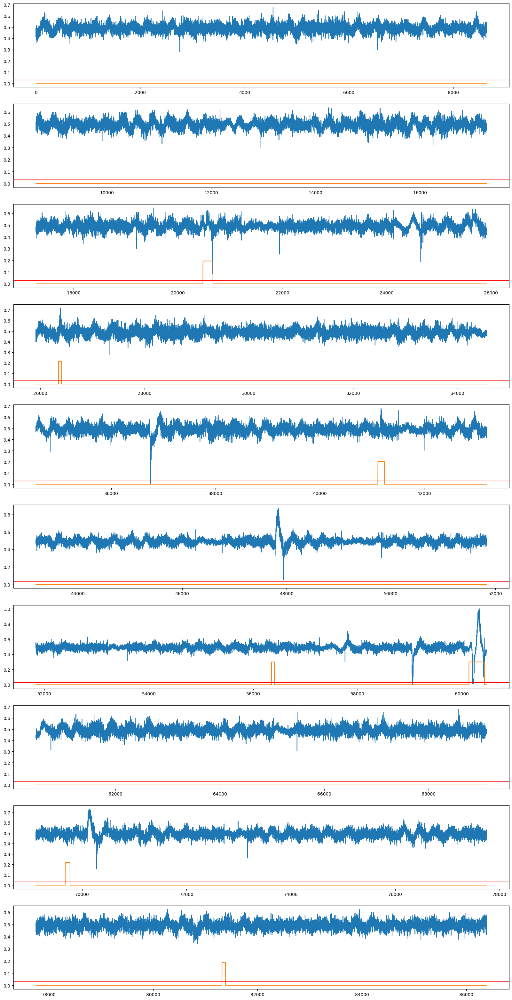

In [ ]:
check_graph2(normalize_2(VALIDATION_DF,['C24']), labels, piece=10, THRESHOLD=THRESHOLD)

/usr/local/lib/python3.10/dist-packages/numpy/core/fromnumeric.py:84: FutureWarning: In a future version, DataFrame.max(axis=None) will return a scalar max over the entire DataFrame. To retain the old behavior, use 'frame.max(axis=0)' or just 'frame.max()'
  return reduction(axis=axis, out=out, **passkwargs)
/usr/local/lib/python3.10/dist-packages/numpy/core/fromnumeric.py:84: FutureWarning: In a future version, DataFrame.max(axis=None) will return a scalar max over the entire DataFrame. To retain the old behavior, use 'frame.max(axis=0)' or just 'frame.max()'
  return reduction(axis=axis, out=out, **passkwargs)
/usr/local/lib/python3.10/dist-packages/numpy/core/fromnumeric.py:84: FutureWarning: In a future version, DataFrame.max(axis=None) will return a scalar max over the entire DataFrame. To retain the old behavior, use 'frame.max(axis=0)' or just 'frame.max()'
  return reduction(axis=axis, out=out, **passkwargs)
/usr/local/lib/python3.10/dist-packages/numpy/core/fromnumeric.py:84: 

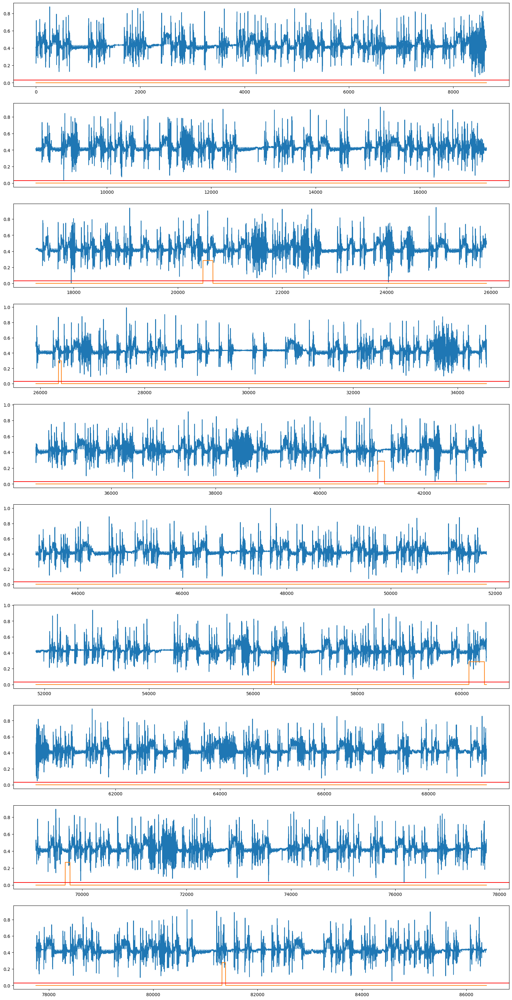

In [ ]:
check_graph2(normalize_2(VALIDATION_DF,['C11']), labels, piece=10, THRESHOLD=THRESHOLD)

/usr/local/lib/python3.10/dist-packages/numpy/core/fromnumeric.py:84: FutureWarning: In a future version, DataFrame.max(axis=None) will return a scalar max over the entire DataFrame. To retain the old behavior, use 'frame.max(axis=0)' or just 'frame.max()'
  return reduction(axis=axis, out=out, **passkwargs)
/usr/local/lib/python3.10/dist-packages/numpy/core/fromnumeric.py:84: FutureWarning: In a future version, DataFrame.max(axis=None) will return a scalar max over the entire DataFrame. To retain the old behavior, use 'frame.max(axis=0)' or just 'frame.max()'
  return reduction(axis=axis, out=out, **passkwargs)
/usr/local/lib/python3.10/dist-packages/numpy/core/fromnumeric.py:84: FutureWarning: In a future version, DataFrame.max(axis=None) will return a scalar max over the entire DataFrame. To retain the old behavior, use 'frame.max(axis=0)' or just 'frame.max()'
  return reduction(axis=axis, out=out, **passkwargs)
/usr/local/lib/python3.10/dist-packages/numpy/core/fromnumeric.py:84: 

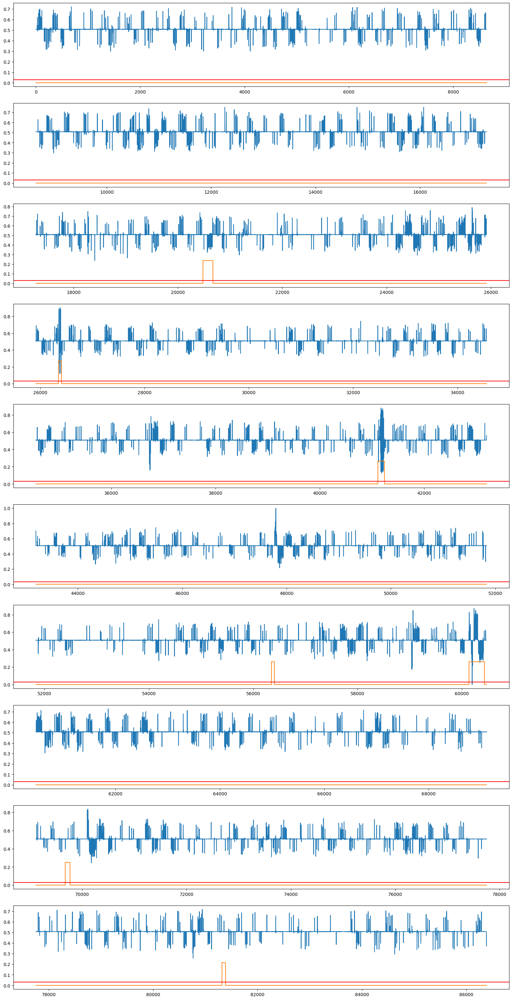

In [ ]:
check_graph2(normalize_2(VALIDATION_DF,['C12']), labels, piece=10, THRESHOLD=THRESHOLD)

/usr/local/lib/python3.10/dist-packages/numpy/core/fromnumeric.py:84: FutureWarning: In a future version, DataFrame.max(axis=None) will return a scalar max over the entire DataFrame. To retain the old behavior, use 'frame.max(axis=0)' or just 'frame.max()'
  return reduction(axis=axis, out=out, **passkwargs)
/usr/local/lib/python3.10/dist-packages/numpy/core/fromnumeric.py:84: FutureWarning: In a future version, DataFrame.max(axis=None) will return a scalar max over the entire DataFrame. To retain the old behavior, use 'frame.max(axis=0)' or just 'frame.max()'
  return reduction(axis=axis, out=out, **passkwargs)
/usr/local/lib/python3.10/dist-packages/numpy/core/fromnumeric.py:84: FutureWarning: In a future version, DataFrame.max(axis=None) will return a scalar max over the entire DataFrame. To retain the old behavior, use 'frame.max(axis=0)' or just 'frame.max()'
  return reduction(axis=axis, out=out, **passkwargs)
/usr/local/lib/python3.10/dist-packages/numpy/core/fromnumeric.py:84: 

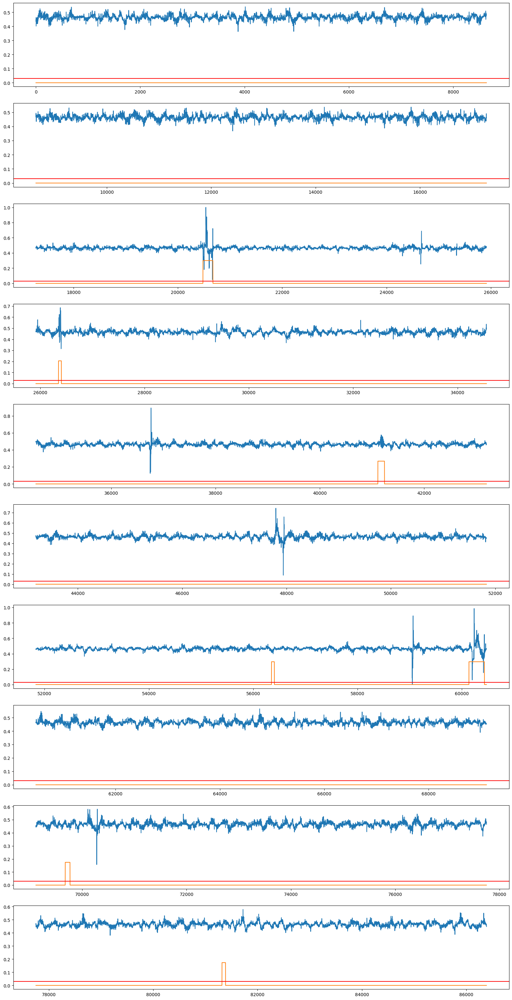

In [ ]:
check_graph2(normalize_2(VALIDATION_DF,['C16']), labels, piece=10, THRESHOLD=THRESHOLD)

/usr/local/lib/python3.10/dist-packages/numpy/core/fromnumeric.py:84: FutureWarning: In a future version, DataFrame.max(axis=None) will return a scalar max over the entire DataFrame. To retain the old behavior, use 'frame.max(axis=0)' or just 'frame.max()'
  return reduction(axis=axis, out=out, **passkwargs)
/usr/local/lib/python3.10/dist-packages/numpy/core/fromnumeric.py:84: FutureWarning: In a future version, DataFrame.max(axis=None) will return a scalar max over the entire DataFrame. To retain the old behavior, use 'frame.max(axis=0)' or just 'frame.max()'
  return reduction(axis=axis, out=out, **passkwargs)
/usr/local/lib/python3.10/dist-packages/numpy/core/fromnumeric.py:84: FutureWarning: In a future version, DataFrame.max(axis=None) will return a scalar max over the entire DataFrame. To retain the old behavior, use 'frame.max(axis=0)' or just 'frame.max()'
  return reduction(axis=axis, out=out, **passkwargs)
/usr/local/lib/python3.10/dist-packages/numpy/core/fromnumeric.py:84: 

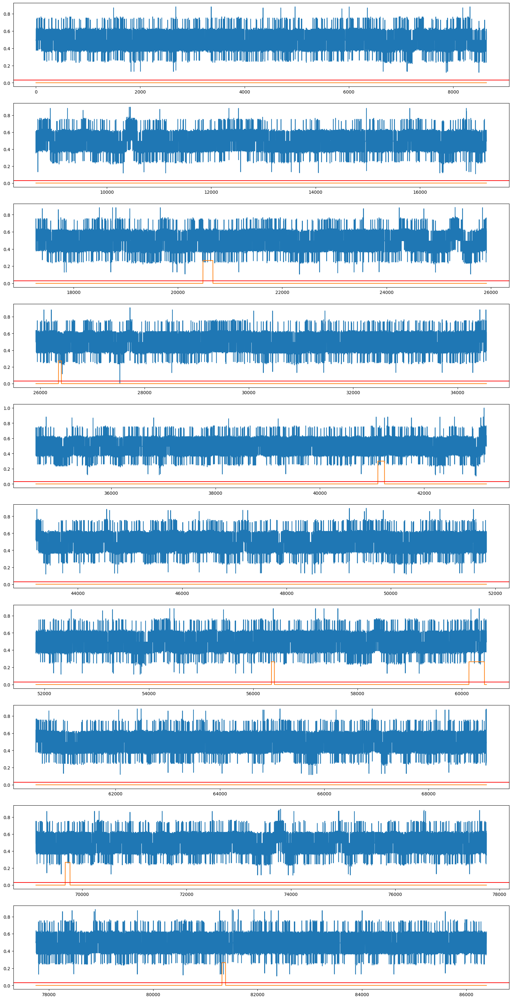

In [ ]:
check_graph2(normalize_2(VALIDATION_DF,['C21']), labels, piece=10, THRESHOLD=THRESHOLD)

/usr/local/lib/python3.10/dist-packages/numpy/core/fromnumeric.py:84: FutureWarning: In a future version, DataFrame.max(axis=None) will return a scalar max over the entire DataFrame. To retain the old behavior, use 'frame.max(axis=0)' or just 'frame.max()'
  return reduction(axis=axis, out=out, **passkwargs)
/usr/local/lib/python3.10/dist-packages/numpy/core/fromnumeric.py:84: FutureWarning: In a future version, DataFrame.max(axis=None) will return a scalar max over the entire DataFrame. To retain the old behavior, use 'frame.max(axis=0)' or just 'frame.max()'
  return reduction(axis=axis, out=out, **passkwargs)
/usr/local/lib/python3.10/dist-packages/numpy/core/fromnumeric.py:84: FutureWarning: In a future version, DataFrame.max(axis=None) will return a scalar max over the entire DataFrame. To retain the old behavior, use 'frame.max(axis=0)' or just 'frame.max()'
  return reduction(axis=axis, out=out, **passkwargs)
/usr/local/lib/python3.10/dist-packages/numpy/core/fromnumeric.py:84: 

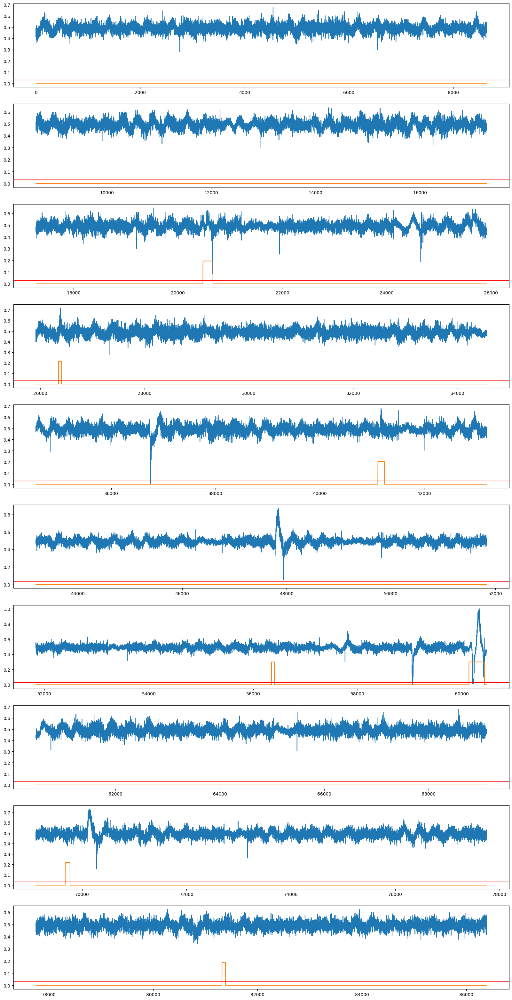

In [ ]:
check_graph2(normalize_2(VALIDATION_DF,['C24']), labels, piece=10, THRESHOLD=THRESHOLD)

/usr/local/lib/python3.10/dist-packages/numpy/core/fromnumeric.py:84: FutureWarning: In a future version, DataFrame.max(axis=None) will return a scalar max over the entire DataFrame. To retain the old behavior, use 'frame.max(axis=0)' or just 'frame.max()'
  return reduction(axis=axis, out=out, **passkwargs)
/usr/local/lib/python3.10/dist-packages/numpy/core/fromnumeric.py:84: FutureWarning: In a future version, DataFrame.max(axis=None) will return a scalar max over the entire DataFrame. To retain the old behavior, use 'frame.max(axis=0)' or just 'frame.max()'
  return reduction(axis=axis, out=out, **passkwargs)
/usr/local/lib/python3.10/dist-packages/numpy/core/fromnumeric.py:84: FutureWarning: In a future version, DataFrame.max(axis=None) will return a scalar max over the entire DataFrame. To retain the old behavior, use 'frame.max(axis=0)' or just 'frame.max()'
  return reduction(axis=axis, out=out, **passkwargs)
/usr/local/lib/python3.10/dist-packages/numpy/core/fromnumeric.py:84: 

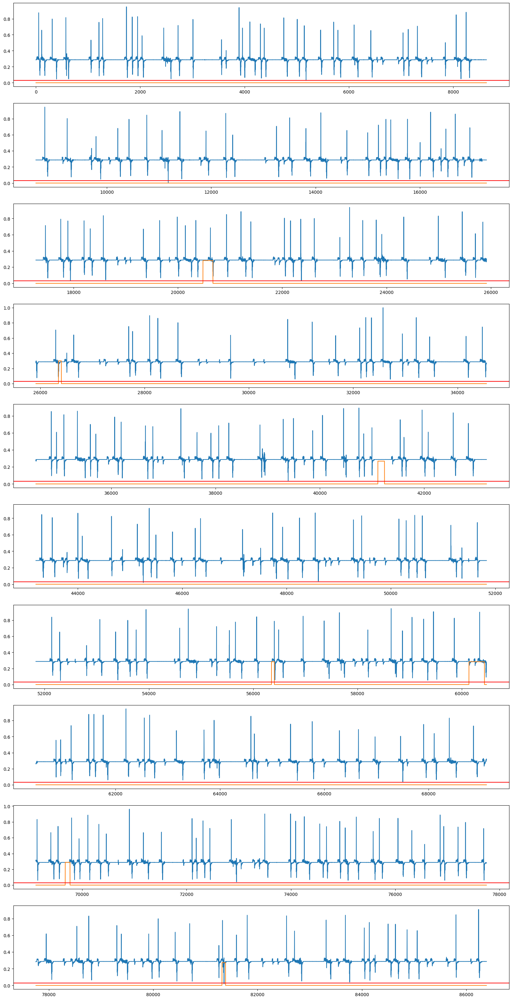

In [ ]:
check_graph2(normalize_2(VALIDATION_DF,['C25']), labels, piece=10, THRESHOLD=THRESHOLD)

/usr/local/lib/python3.10/dist-packages/numpy/core/fromnumeric.py:84: FutureWarning: In a future version, DataFrame.max(axis=None) will return a scalar max over the entire DataFrame. To retain the old behavior, use 'frame.max(axis=0)' or just 'frame.max()'
  return reduction(axis=axis, out=out, **passkwargs)
/usr/local/lib/python3.10/dist-packages/numpy/core/fromnumeric.py:84: FutureWarning: In a future version, DataFrame.max(axis=None) will return a scalar max over the entire DataFrame. To retain the old behavior, use 'frame.max(axis=0)' or just 'frame.max()'
  return reduction(axis=axis, out=out, **passkwargs)
/usr/local/lib/python3.10/dist-packages/numpy/core/fromnumeric.py:84: FutureWarning: In a future version, DataFrame.max(axis=None) will return a scalar max over the entire DataFrame. To retain the old behavior, use 'frame.max(axis=0)' or just 'frame.max()'
  return reduction(axis=axis, out=out, **passkwargs)
/usr/local/lib/python3.10/dist-packages/numpy/core/fromnumeric.py:84: 

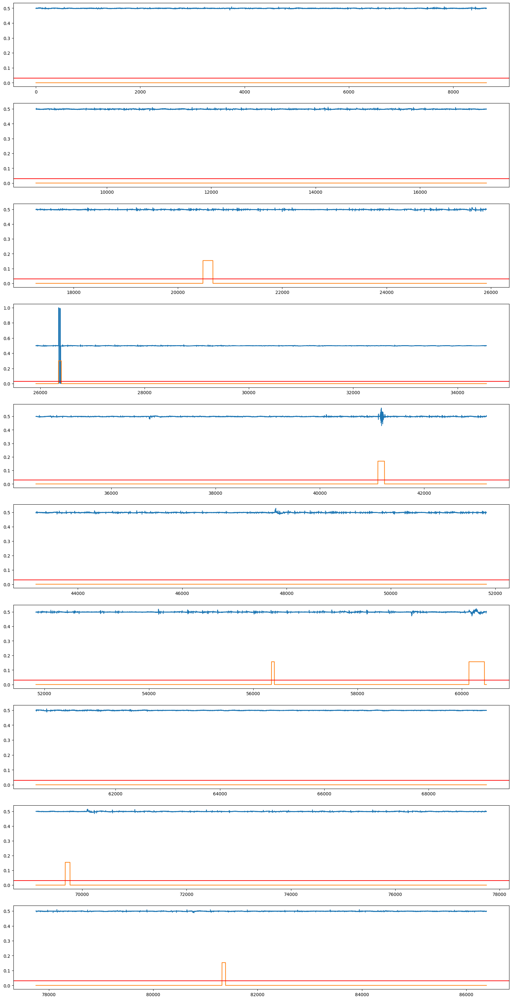

In [ ]:
check_graph2(normalize_2(VALIDATION_DF,['C43']), labels, piece=10, THRESHOLD=THRESHOLD)

/usr/local/lib/python3.10/dist-packages/numpy/core/fromnumeric.py:84: FutureWarning: In a future version, DataFrame.max(axis=None) will return a scalar max over the entire DataFrame. To retain the old behavior, use 'frame.max(axis=0)' or just 'frame.max()'
  return reduction(axis=axis, out=out, **passkwargs)
/usr/local/lib/python3.10/dist-packages/numpy/core/fromnumeric.py:84: FutureWarning: In a future version, DataFrame.max(axis=None) will return a scalar max over the entire DataFrame. To retain the old behavior, use 'frame.max(axis=0)' or just 'frame.max()'
  return reduction(axis=axis, out=out, **passkwargs)
/usr/local/lib/python3.10/dist-packages/numpy/core/fromnumeric.py:84: FutureWarning: In a future version, DataFrame.max(axis=None) will return a scalar max over the entire DataFrame. To retain the old behavior, use 'frame.max(axis=0)' or just 'frame.max()'
  return reduction(axis=axis, out=out, **passkwargs)
/usr/local/lib/python3.10/dist-packages/numpy/core/fromnumeric.py:84: 

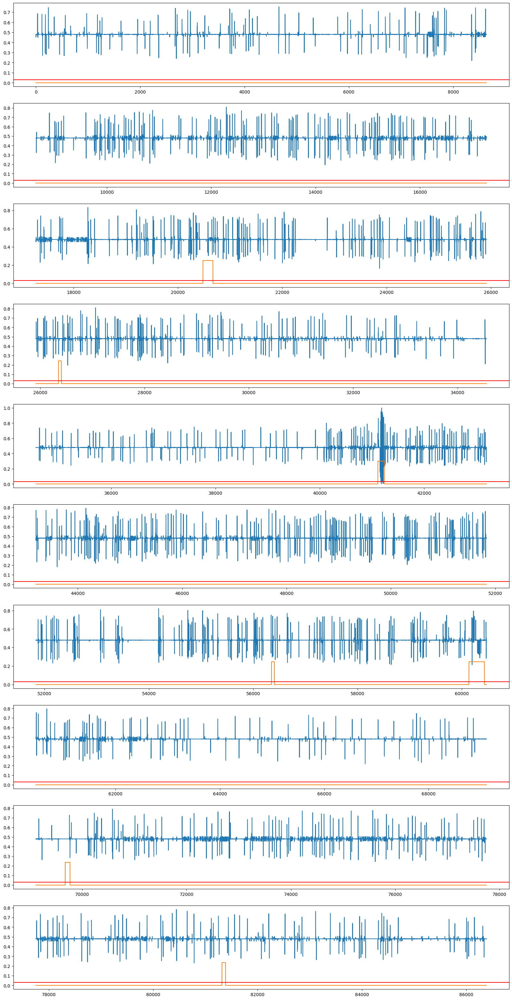

In [ ]:
check_graph2(normalize_2(VALIDATION_DF,['C59']), labels, piece=10, THRESHOLD=THRESHOLD)

/usr/local/lib/python3.10/dist-packages/numpy/core/fromnumeric.py:84: FutureWarning: In a future version, DataFrame.max(axis=None) will return a scalar max over the entire DataFrame. To retain the old behavior, use 'frame.max(axis=0)' or just 'frame.max()'
  return reduction(axis=axis, out=out, **passkwargs)
/usr/local/lib/python3.10/dist-packages/numpy/core/fromnumeric.py:84: FutureWarning: In a future version, DataFrame.max(axis=None) will return a scalar max over the entire DataFrame. To retain the old behavior, use 'frame.max(axis=0)' or just 'frame.max()'
  return reduction(axis=axis, out=out, **passkwargs)
/usr/local/lib/python3.10/dist-packages/numpy/core/fromnumeric.py:84: FutureWarning: In a future version, DataFrame.max(axis=None) will return a scalar max over the entire DataFrame. To retain the old behavior, use 'frame.max(axis=0)' or just 'frame.max()'
  return reduction(axis=axis, out=out, **passkwargs)
/usr/local/lib/python3.10/dist-packages/numpy/core/fromnumeric.py:84: 

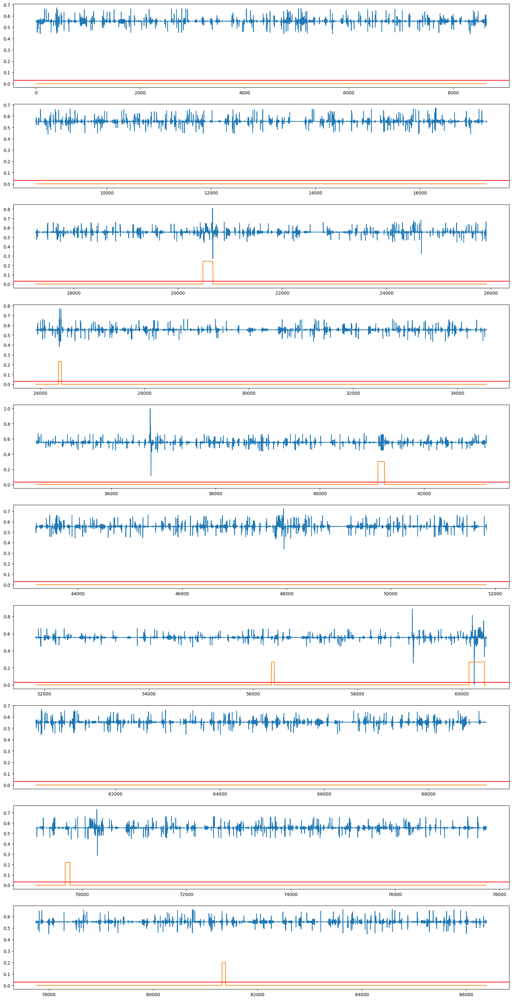

In [ ]:
check_graph2(normalize_2(VALIDATION_DF,['C68']), labels, piece=10, THRESHOLD=THRESHOLD)

/usr/local/lib/python3.10/dist-packages/numpy/core/fromnumeric.py:84: FutureWarning: In a future version, DataFrame.max(axis=None) will return a scalar max over the entire DataFrame. To retain the old behavior, use 'frame.max(axis=0)' or just 'frame.max()'
  return reduction(axis=axis, out=out, **passkwargs)
/usr/local/lib/python3.10/dist-packages/numpy/core/fromnumeric.py:84: FutureWarning: In a future version, DataFrame.max(axis=None) will return a scalar max over the entire DataFrame. To retain the old behavior, use 'frame.max(axis=0)' or just 'frame.max()'
  return reduction(axis=axis, out=out, **passkwargs)
/usr/local/lib/python3.10/dist-packages/numpy/core/fromnumeric.py:84: FutureWarning: In a future version, DataFrame.max(axis=None) will return a scalar max over the entire DataFrame. To retain the old behavior, use 'frame.max(axis=0)' or just 'frame.max()'
  return reduction(axis=axis, out=out, **passkwargs)
/usr/local/lib/python3.10/dist-packages/numpy/core/fromnumeric.py:84: 

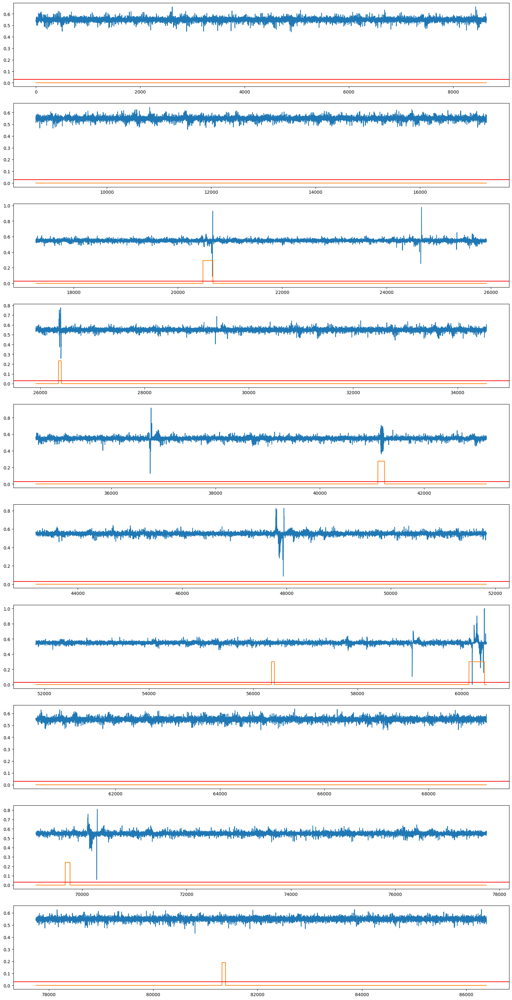

In [ ]:
check_graph2(normalize_2(VALIDATION_DF,['C70']), labels, piece=10, THRESHOLD=THRESHOLD)

/usr/local/lib/python3.10/dist-packages/numpy/core/fromnumeric.py:84: FutureWarning: In a future version, DataFrame.max(axis=None) will return a scalar max over the entire DataFrame. To retain the old behavior, use 'frame.max(axis=0)' or just 'frame.max()'
  return reduction(axis=axis, out=out, **passkwargs)
/usr/local/lib/python3.10/dist-packages/numpy/core/fromnumeric.py:84: FutureWarning: In a future version, DataFrame.max(axis=None) will return a scalar max over the entire DataFrame. To retain the old behavior, use 'frame.max(axis=0)' or just 'frame.max()'
  return reduction(axis=axis, out=out, **passkwargs)
/usr/local/lib/python3.10/dist-packages/numpy/core/fromnumeric.py:84: FutureWarning: In a future version, DataFrame.max(axis=None) will return a scalar max over the entire DataFrame. To retain the old behavior, use 'frame.max(axis=0)' or just 'frame.max()'
  return reduction(axis=axis, out=out, **passkwargs)
/usr/local/lib/python3.10/dist-packages/numpy/core/fromnumeric.py:84: 

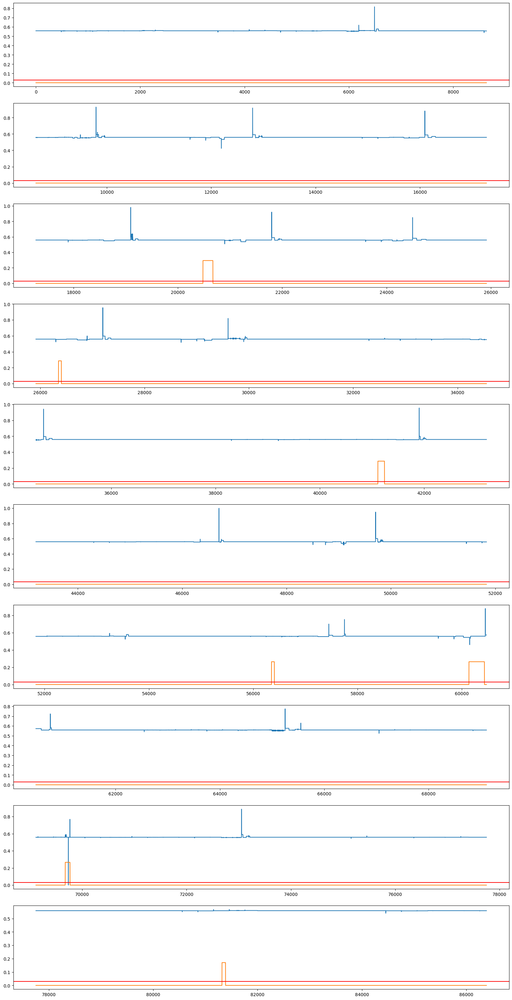

In [ ]:
check_graph2(normalize_2(VALIDATION_DF,['C71']), labels, piece=10, THRESHOLD=THRESHOLD)

/usr/local/lib/python3.10/dist-packages/numpy/core/fromnumeric.py:84: FutureWarning: In a future version, DataFrame.max(axis=None) will return a scalar max over the entire DataFrame. To retain the old behavior, use 'frame.max(axis=0)' or just 'frame.max()'
  return reduction(axis=axis, out=out, **passkwargs)
/usr/local/lib/python3.10/dist-packages/numpy/core/fromnumeric.py:84: FutureWarning: In a future version, DataFrame.max(axis=None) will return a scalar max over the entire DataFrame. To retain the old behavior, use 'frame.max(axis=0)' or just 'frame.max()'
  return reduction(axis=axis, out=out, **passkwargs)
/usr/local/lib/python3.10/dist-packages/numpy/core/fromnumeric.py:84: FutureWarning: In a future version, DataFrame.max(axis=None) will return a scalar max over the entire DataFrame. To retain the old behavior, use 'frame.max(axis=0)' or just 'frame.max()'
  return reduction(axis=axis, out=out, **passkwargs)
/usr/local/lib/python3.10/dist-packages/numpy/core/fromnumeric.py:84: 

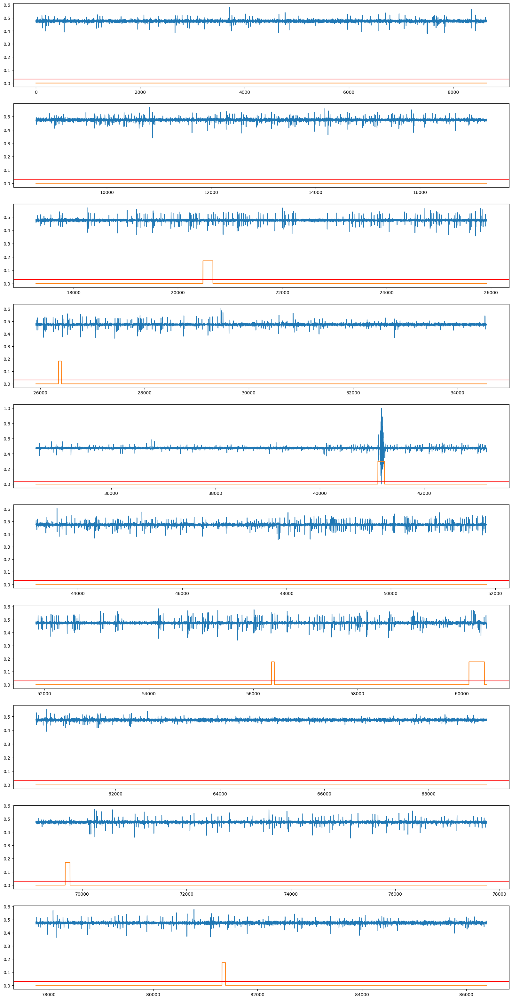

In [ ]:
check_graph2(normalize_2(VALIDATION_DF,['C73']), labels, piece=10, THRESHOLD=THRESHOLD)

In [ ]:
check_graph2(normalize_2(VALIDATION_DF,['C74']), labels, piece=10, THRESHOLD=THRESHOLD)

/usr/local/lib/python3.10/dist-packages/numpy/core/fromnumeric.py:84: FutureWarning: In a future version, DataFrame.max(axis=None) will return a scalar max over the entire DataFrame. To retain the old behavior, use 'frame.max(axis=0)' or just 'frame.max()'
  return reduction(axis=axis, out=out, **passkwargs)
/usr/local/lib/python3.10/dist-packages/numpy/core/fromnumeric.py:84: FutureWarning: In a future version, DataFrame.max(axis=None) will return a scalar max over the entire DataFrame. To retain the old behavior, use 'frame.max(axis=0)' or just 'frame.max()'
  return reduction(axis=axis, out=out, **passkwargs)
/usr/local/lib/python3.10/dist-packages/numpy/core/fromnumeric.py:84: FutureWarning: In a future version, DataFrame.max(axis=None) will return a scalar max over the entire DataFrame. To retain the old behavior, use 'frame.max(axis=0)' or just 'frame.max()'
  return reduction(axis=axis, out=out, **passkwargs)
/usr/local/lib/python3.10/dist-packages/numpy/core/fromnumeric.py:84: 

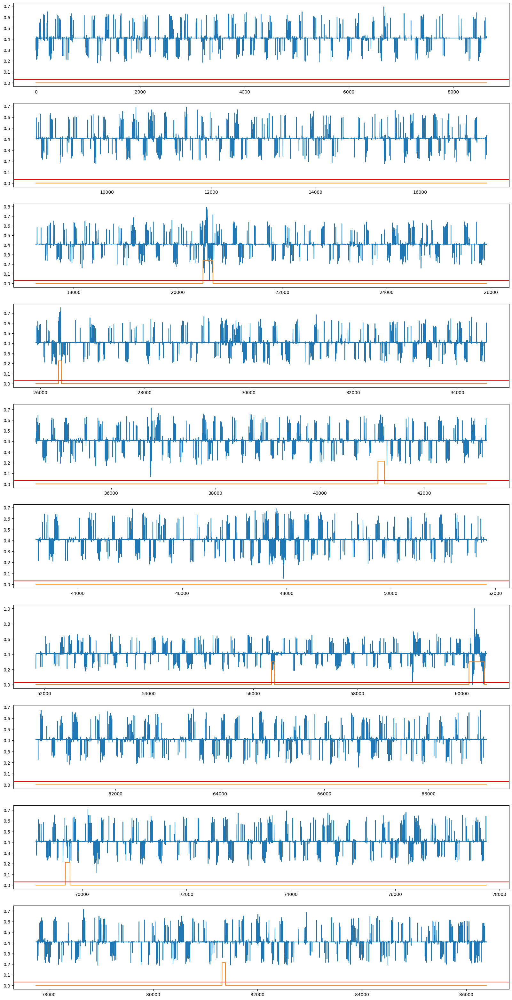

In [ ]:
check_graph2(normalize_2(VALIDATION_DF,['C75']), labels, piece=10, THRESHOLD=THRESHOLD)

/usr/local/lib/python3.10/dist-packages/numpy/core/fromnumeric.py:84: FutureWarning: In a future version, DataFrame.max(axis=None) will return a scalar max over the entire DataFrame. To retain the old behavior, use 'frame.max(axis=0)' or just 'frame.max()'
  return reduction(axis=axis, out=out, **passkwargs)
/usr/local/lib/python3.10/dist-packages/numpy/core/fromnumeric.py:84: FutureWarning: In a future version, DataFrame.max(axis=None) will return a scalar max over the entire DataFrame. To retain the old behavior, use 'frame.max(axis=0)' or just 'frame.max()'
  return reduction(axis=axis, out=out, **passkwargs)
/usr/local/lib/python3.10/dist-packages/numpy/core/fromnumeric.py:84: FutureWarning: In a future version, DataFrame.max(axis=None) will return a scalar max over the entire DataFrame. To retain the old behavior, use 'frame.max(axis=0)' or just 'frame.max()'
  return reduction(axis=axis, out=out, **passkwargs)
/usr/local/lib/python3.10/dist-packages/numpy/core/fromnumeric.py:84: 

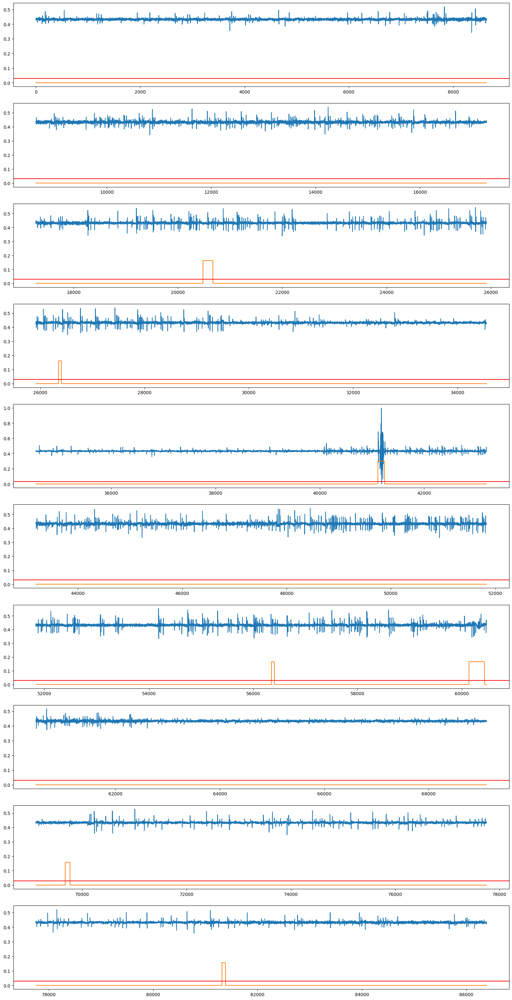

In [ ]:
check_graph2(normalize_2(VALIDATION_DF,['C76']), labels, piece=10, THRESHOLD=THRESHOLD)

/usr/local/lib/python3.10/dist-packages/numpy/core/fromnumeric.py:84: FutureWarning: In a future version, DataFrame.max(axis=None) will return a scalar max over the entire DataFrame. To retain the old behavior, use 'frame.max(axis=0)' or just 'frame.max()'
  return reduction(axis=axis, out=out, **passkwargs)
/usr/local/lib/python3.10/dist-packages/numpy/core/fromnumeric.py:84: FutureWarning: In a future version, DataFrame.max(axis=None) will return a scalar max over the entire DataFrame. To retain the old behavior, use 'frame.max(axis=0)' or just 'frame.max()'
  return reduction(axis=axis, out=out, **passkwargs)
/usr/local/lib/python3.10/dist-packages/numpy/core/fromnumeric.py:84: FutureWarning: In a future version, DataFrame.max(axis=None) will return a scalar max over the entire DataFrame. To retain the old behavior, use 'frame.max(axis=0)' or just 'frame.max()'
  return reduction(axis=axis, out=out, **passkwargs)
/usr/local/lib/python3.10/dist-packages/numpy/core/fromnumeric.py:84: 

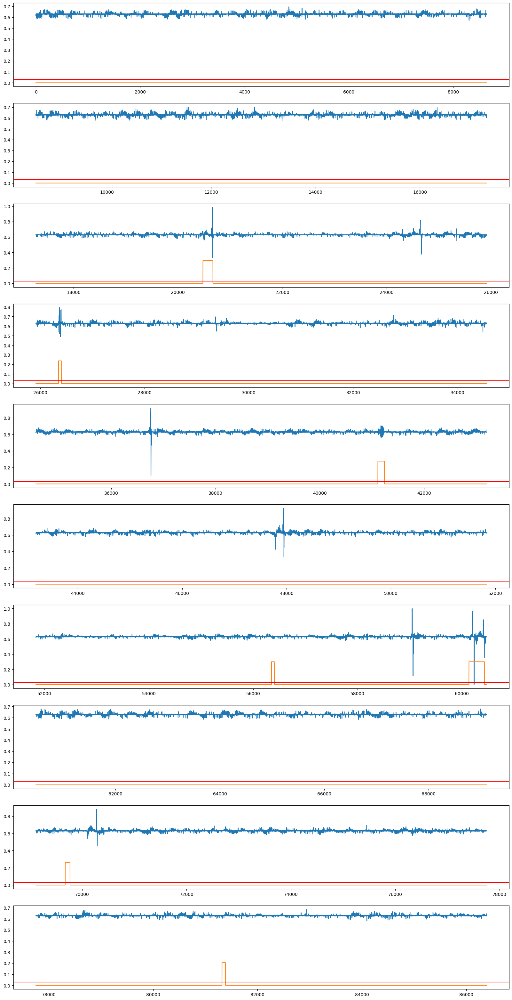

In [ ]:
check_graph2(normalize_2(VALIDATION_DF,['C77']), labels, piece=10, THRESHOLD=THRESHOLD)

/usr/local/lib/python3.10/dist-packages/numpy/core/fromnumeric.py:84: FutureWarning: In a future version, DataFrame.max(axis=None) will return a scalar max over the entire DataFrame. To retain the old behavior, use 'frame.max(axis=0)' or just 'frame.max()'
  return reduction(axis=axis, out=out, **passkwargs)
/usr/local/lib/python3.10/dist-packages/numpy/core/fromnumeric.py:84: FutureWarning: In a future version, DataFrame.max(axis=None) will return a scalar max over the entire DataFrame. To retain the old behavior, use 'frame.max(axis=0)' or just 'frame.max()'
  return reduction(axis=axis, out=out, **passkwargs)
/usr/local/lib/python3.10/dist-packages/numpy/core/fromnumeric.py:84: FutureWarning: In a future version, DataFrame.max(axis=None) will return a scalar max over the entire DataFrame. To retain the old behavior, use 'frame.max(axis=0)' or just 'frame.max()'
  return reduction(axis=axis, out=out, **passkwargs)
/usr/local/lib/python3.10/dist-packages/numpy/core/fromnumeric.py:84: 

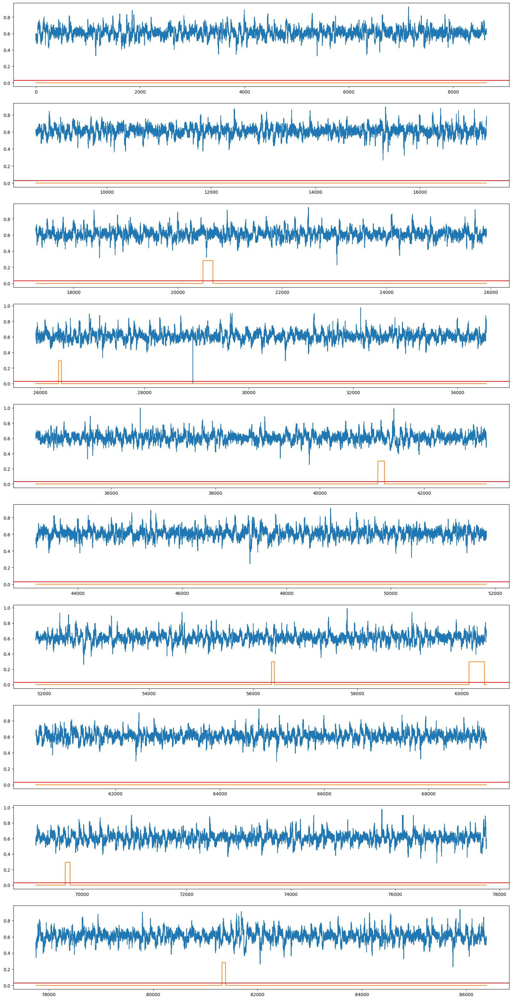

In [ ]:
check_graph2(normalize_2(VALIDATION_DF,['C78']), labels, piece=10, THRESHOLD=THRESHOLD)

/usr/local/lib/python3.10/dist-packages/numpy/core/fromnumeric.py:84: FutureWarning: In a future version, DataFrame.max(axis=None) will return a scalar max over the entire DataFrame. To retain the old behavior, use 'frame.max(axis=0)' or just 'frame.max()'
  return reduction(axis=axis, out=out, **passkwargs)
/usr/local/lib/python3.10/dist-packages/numpy/core/fromnumeric.py:84: FutureWarning: In a future version, DataFrame.max(axis=None) will return a scalar max over the entire DataFrame. To retain the old behavior, use 'frame.max(axis=0)' or just 'frame.max()'
  return reduction(axis=axis, out=out, **passkwargs)
/usr/local/lib/python3.10/dist-packages/numpy/core/fromnumeric.py:84: FutureWarning: In a future version, DataFrame.max(axis=None) will return a scalar max over the entire DataFrame. To retain the old behavior, use 'frame.max(axis=0)' or just 'frame.max()'
  return reduction(axis=axis, out=out, **passkwargs)
/usr/local/lib/python3.10/dist-packages/numpy/core/fromnumeric.py:84: 

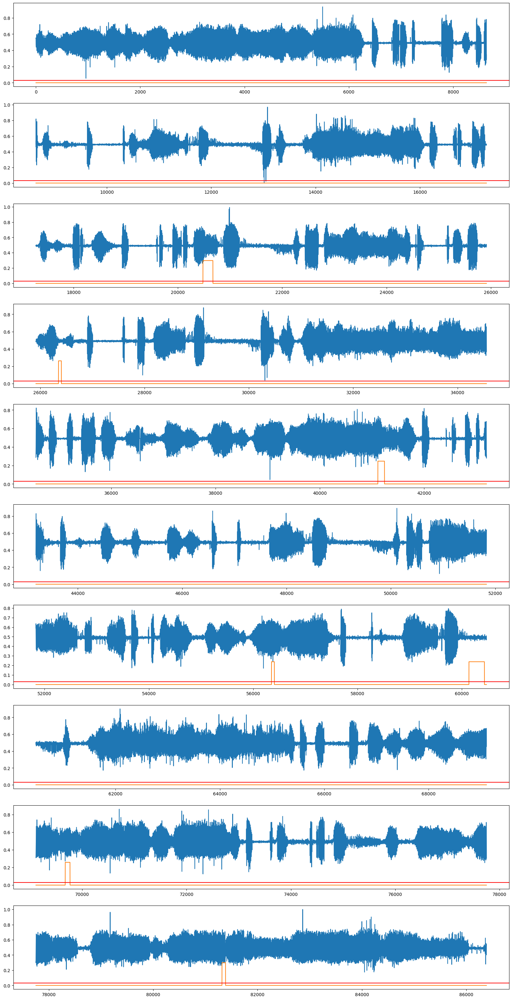

In [ ]:
check_graph2(normalize_2(VALIDATION_DF,['C80']), labels, piece=10, THRESHOLD=THRESHOLD)

/usr/local/lib/python3.10/dist-packages/numpy/core/fromnumeric.py:84: FutureWarning: In a future version, DataFrame.max(axis=None) will return a scalar max over the entire DataFrame. To retain the old behavior, use 'frame.max(axis=0)' or just 'frame.max()'
  return reduction(axis=axis, out=out, **passkwargs)
/usr/local/lib/python3.10/dist-packages/numpy/core/fromnumeric.py:84: FutureWarning: In a future version, DataFrame.max(axis=None) will return a scalar max over the entire DataFrame. To retain the old behavior, use 'frame.max(axis=0)' or just 'frame.max()'
  return reduction(axis=axis, out=out, **passkwargs)
/usr/local/lib/python3.10/dist-packages/numpy/core/fromnumeric.py:84: FutureWarning: In a future version, DataFrame.max(axis=None) will return a scalar max over the entire DataFrame. To retain the old behavior, use 'frame.max(axis=0)' or just 'frame.max()'
  return reduction(axis=axis, out=out, **passkwargs)
/usr/local/lib/python3.10/dist-packages/numpy/core/fromnumeric.py:84: 

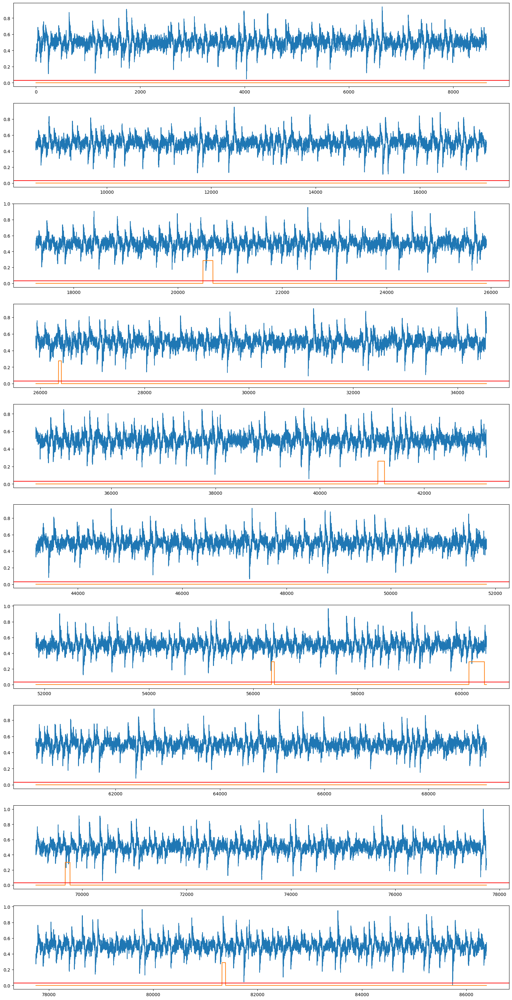

In [ ]:
check_graph2(normalize_2(VALIDATION_DF,['C81']), labels, piece=10, THRESHOLD=THRESHOLD)

/usr/local/lib/python3.10/dist-packages/numpy/core/fromnumeric.py:84: FutureWarning: In a future version, DataFrame.max(axis=None) will return a scalar max over the entire DataFrame. To retain the old behavior, use 'frame.max(axis=0)' or just 'frame.max()'
  return reduction(axis=axis, out=out, **passkwargs)
/usr/local/lib/python3.10/dist-packages/numpy/core/fromnumeric.py:84: FutureWarning: In a future version, DataFrame.max(axis=None) will return a scalar max over the entire DataFrame. To retain the old behavior, use 'frame.max(axis=0)' or just 'frame.max()'
  return reduction(axis=axis, out=out, **passkwargs)
/usr/local/lib/python3.10/dist-packages/numpy/core/fromnumeric.py:84: FutureWarning: In a future version, DataFrame.max(axis=None) will return a scalar max over the entire DataFrame. To retain the old behavior, use 'frame.max(axis=0)' or just 'frame.max()'
  return reduction(axis=axis, out=out, **passkwargs)
/usr/local/lib/python3.10/dist-packages/numpy/core/fromnumeric.py:84: 

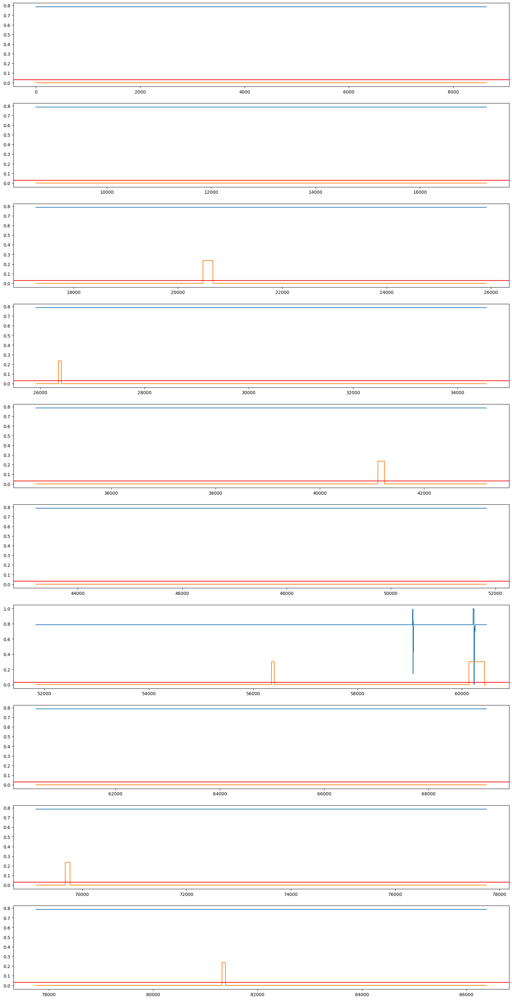

In [ ]:
check_graph2(normalize_2(VALIDATION_DF,['C84']), labels, piece=10, THRESHOLD=THRESHOLD)

/usr/local/lib/python3.10/dist-packages/numpy/core/fromnumeric.py:84: FutureWarning: In a future version, DataFrame.max(axis=None) will return a scalar max over the entire DataFrame. To retain the old behavior, use 'frame.max(axis=0)' or just 'frame.max()'
  return reduction(axis=axis, out=out, **passkwargs)
/usr/local/lib/python3.10/dist-packages/numpy/core/fromnumeric.py:84: FutureWarning: In a future version, DataFrame.max(axis=None) will return a scalar max over the entire DataFrame. To retain the old behavior, use 'frame.max(axis=0)' or just 'frame.max()'
  return reduction(axis=axis, out=out, **passkwargs)
/usr/local/lib/python3.10/dist-packages/numpy/core/fromnumeric.py:84: FutureWarning: In a future version, DataFrame.max(axis=None) will return a scalar max over the entire DataFrame. To retain the old behavior, use 'frame.max(axis=0)' or just 'frame.max()'
  return reduction(axis=axis, out=out, **passkwargs)
/usr/local/lib/python3.10/dist-packages/numpy/core/fromnumeric.py:84: 

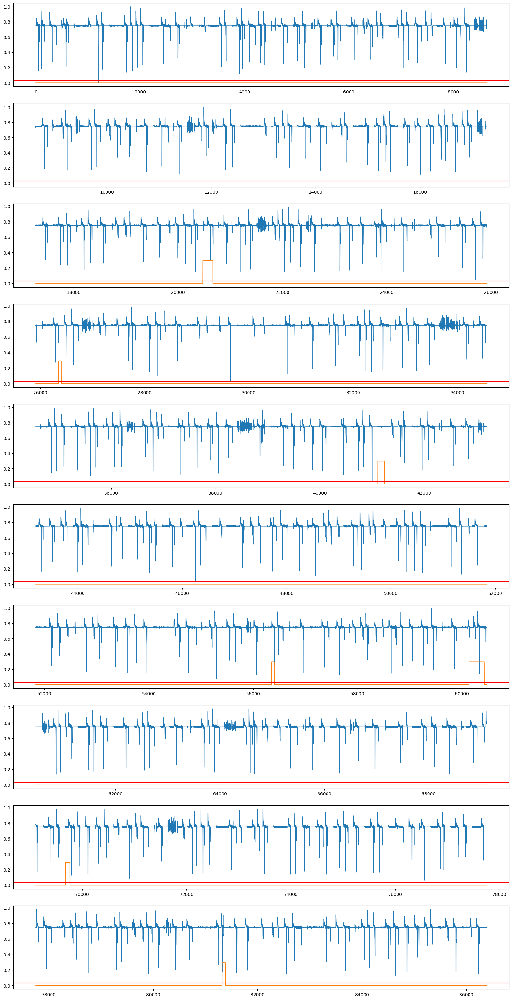

In [ ]:
check_graph2(normalize_2(VALIDATION_DF,['C86']), labels, piece=10, THRESHOLD=THRESHOLD)

#AE 모델

In [ ]:
def boundary_check(df):
    x = np.array(df, dtype=np.float32)
    return np.any(x > 1.0), np.any(x < 0), np.any(np.isnan(x))

In [ ]:
window_size=12

windows_normal_01 = TRAIN_DF_01.values[np.arange(window_size)[None, :] + np.arange(TRAIN_DF_01.shape[0]-window_size)[:, None]]

In [ ]:
windows_normal_02 = TRAIN_DF_02.values[np.arange(window_size)[None, :] + np.arange(TRAIN_DF_02.shape[0]-window_size)[:, None]]
windows_normal_03 = TRAIN_DF_03.values[np.arange(window_size)[None, :] + np.arange(TRAIN_DF_03.shape[0]-window_size)[:, None]]
windows_normal_04 = TRAIN_DF_04.values[np.arange(window_size)[None, :] + np.arange(TRAIN_DF_04.shape[0]-window_size)[:, None]]
windows_normal_05 = TRAIN_DF_05.values[np.arange(window_size)[None, :] + np.arange(TRAIN_DF_05.shape[0]-window_size)[:, None]]
windows_normal_06 = TRAIN_DF_06.values[np.arange(window_size)[None, :] + np.arange(TRAIN_DF_06.shape[0]-window_size)[:, None]]

In [ ]:
import torch.utils.data as data_utils

BATCH_SIZE =  1000
N_EPOCHS = 50
hidden_size = 100

w_size=windows_normal_01.shape[1]*windows_normal_01.shape[2]
z_size=windows_normal_01.shape[1]*hidden_size

In [ ]:
train_loader_01 = data_utils.TensorDataset(torch.from_numpy(windows_normal_01).float().view(([windows_normal_01.shape[0],w_size])))
train_loader_02 = data_utils.TensorDataset(torch.from_numpy(windows_normal_02).float().view(([windows_normal_02.shape[0],w_size])))
train_loader_03 = data_utils.TensorDataset(torch.from_numpy(windows_normal_03).float().view(([windows_normal_03.shape[0],w_size])))
train_loader_04 = data_utils.TensorDataset(torch.from_numpy(windows_normal_04).float().view(([windows_normal_04.shape[0],w_size])))
train_loader_05 = data_utils.TensorDataset(torch.from_numpy(windows_normal_05).float().view(([windows_normal_05.shape[0],w_size])))

val_loader_01 = data_utils.TensorDataset(torch.from_numpy(windows_normal_06).float().view(([windows_normal_06.shape[0],w_size])))

train_loader = torch.utils.data.DataLoader(data_utils.ConcatDataset(
    [train_loader_01,train_loader_02,train_loader_03, train_loader_04, train_loader_05]
) , batch_size=BATCH_SIZE, shuffle=False, num_workers=0)

val_loader = torch.utils.data.DataLoader(val_loader_01, batch_size=BATCH_SIZE, shuffle=False, num_workers=0)

In [ ]:
model = Autoencoder(w_size, z_size)
model = to_device(model,device)

In [ ]:
model

Autoencoder(
  (encoder): Sequential(
    (0): Linear(in_features=684, out_features=342, bias=True)
    (1): ReLU(inplace=True)
    (2): Linear(in_features=342, out_features=171, bias=True)
    (3): ReLU(inplace=True)
    (4): Linear(in_features=171, out_features=1200, bias=True)
    (5): ReLU(inplace=True)
  )
  (decoder): Sequential(
    (0): Linear(in_features=1200, out_features=171, bias=True)
    (1): ReLU(inplace=True)
    (2): Linear(in_features=171, out_features=342, bias=True)
    (3): ReLU(inplace=True)
    (4): Linear(in_features=342, out_features=684, bias=True)
    (5): Sigmoid()
  )
)

In [ ]:
history = training(N_EPOCHS,model,train_loader,val_loader)

Epoch [0], val_loss: 0.0004
Epoch [1], val_loss: 0.0004


KeyboardInterrupt: ignored

In [ ]:
plot_history(history)

In [ ]:
from os.path import join
from os import makedirs

%cd "{REPO_path}"
try:
  makedirs("models")
except:
  print("동일한 이름의 폴더가 이미 존재합니다.")

In [ ]:
torch.save({
            'encoder': model.encoder.state_dict(),
            'decoder': model.decoder.state_dict()
            }, "./models/usad.pth")

In [ ]:
checkpoint = torch.load("./models/usad.pth")

model.encoder.load_state_dict(checkpoint['encoder'])
model.decoder.load_state_dict(checkpoint['decoder'])

#모델 평가를 위한 Val 데이터 준비

In [ ]:
# VALIDATION_DF_RAW = dataframe_from_csv(VALIDATION_DATASET[0])
# VALIDATION_DF_RAW.reset_index(drop=True,inplace=True)

#Val 데이터 정규화

In [ ]:
# VALIDATION_DF_RAW_NM = normalize(VALIDATION_DF_RAW[VALID_COLUMNS_IN_TRAIN_DATASET])

#Val 데이터 노이즈 제거(지수평활법)

In [ ]:
# VALIDATION_DF = VALIDATION_DF_RAW_NM.ewm(alpha=0.9).mean()

#Val 데이터 차분

In [ ]:
# VALIDATION_DF = VALIDATION_DF.diff(365).dropna()

#Val 데이터 노이즈 제거(DWT): 적용 X

In [ ]:
VALIDATION_DF = dataframe_DN(VALIDATION_DF_RAW_NM)

#Val 데이터를 활용한 모델 평가

다양한 모델을 사용하였습니다만, Train Set을 기준으로 Min-Max Normalize를 진행한 뒤, Validation Set과 Test Set에 대해 Train Dataset의 Min값 혹은 Max값을 넘어가는 값에 x2, x1.5를 해주었을 경우 성능이 소폭 향상되는 모습을 보여주었습니다.

Min-Max Normalization이 어느정도 Anomaly Detection에서 효과를 보여준다는 걸 보여주는 것으로도 볼 수 있고, 값이 튀는 장치들에 실제로도 보안위협이 들어왔다고 생각할 수도 있을 것 같습니다.

In [ ]:
# for i in tqdm(range(VALIDATION_DF.shape[0])):
#     for j in range(VALIDATION_DF.shape[1]):
#         if VALIDATION_DF.iloc[i, j] < 0:
#             VALIDATION_DF.iloc[i, j] = VALIDATION_DF.iloc[i, j] * 2
#         elif VALIDATION_DF.iloc[i, j] > 1:
#             VALIDATION_DF.iloc[i, j] = VALIDATION_DF.iloc[i, j] * 2

In [ ]:
val = VALIDATION_DF.values[np.arange(window_size)[None, :] + np.arange(VALIDATION_DF.shape[0]-window_size)[:, None]]

In [ ]:
test_loader = torch.utils.data.DataLoader(data_utils.TensorDataset(
    torch.from_numpy(val).float().view(([val.shape[0],w_size]))
) , batch_size=BATCH_SIZE, shuffle=False, num_workers=0)

In [ ]:
results = testing(model,test_loader)

In [ ]:
labels = [int(label!= 0 ) for label in VALIDATION_DF_RAW["attack"].values]

In [ ]:
y_pred = np.concatenate([torch.stack(results[:-1]).flatten().detach().cpu().numpy(),
                              results[-1].flatten().detach().cpu().numpy()])

In [ ]:
def check_graph(xs, att, piece=2, THRESHOLD=None):
    l = xs.shape[0]
    chunk = l // piece
    fig, axs = plt.subplots(piece, figsize=(20, 4 * piece))
    for i in range(piece):
        L = i * chunk
        R = min(L + chunk, l)
        xticks = range(L, R)
        axs[i].plot(xticks, xs[L:R])
        if len(xs[L:R]) > 0:
            peak = np.max(xs[L:R])
            axs[i].plot(xticks, att[L:R] * np.array(peak) * np.array(0.3))
        if THRESHOLD!=None:
            axs[i].axhline(y=THRESHOLD, color='r')
    plt.show()

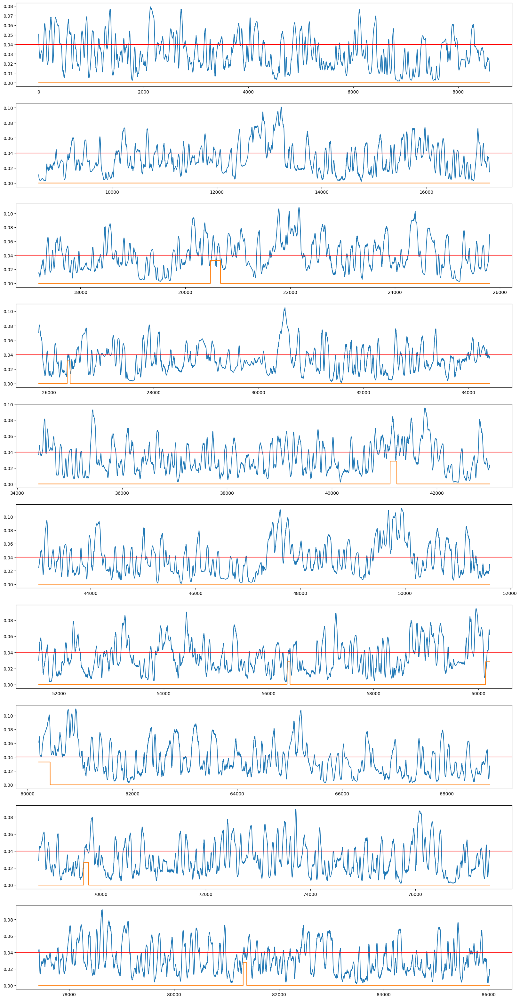

In [ ]:
THRESHOLD = 0.04
check_graph(y_pred, labels, piece=10, THRESHOLD=THRESHOLD)

In [ ]:
def put_labels(distance, threshold):
    xs = np.zeros_like(distance)
    xs[distance > threshold] = 1
    return xs

In [ ]:
LABELS = put_labels(y_pred, THRESHOLD)
LABELS, LABELS.shape

(array([1., 1., 1., ..., 0., 0., 0.], dtype=float32), (86023,))

In [ ]:
a = np.zeros(window_size)
LABELS = np.append(a, LABELS, axis=0)

In [ ]:
TaPR = etapr.evaluate_haicon(anomalies=labels, predictions=LABELS)
print(f"F1: {TaPR['f1']:.3f} (TaP: {TaPR['TaP']:.3f}, TaR: {TaPR['TaR']:.3f})")
print(f"# of detected anomalies: {len(TaPR['Detected_Anomalies'])}")
print(f"Detected anomalies: {TaPR['Detected_Anomalies']}")

F1: 0.019 (TaP: 0.010, TaR: 0.540)
# of detected anomalies: 6
Detected anomalies: [<TaPR_pkg.DataManage.Range.Range object at 0x7f7676397d30>, <TaPR_pkg.DataManage.Range.Range object at 0x7f7676394f10>, <TaPR_pkg.DataManage.Range.Range object at 0x7f7676397ac0>, <TaPR_pkg.DataManage.Range.Range object at 0x7f7676397460>, <TaPR_pkg.DataManage.Range.Range object at 0x7f769f2efd00>, <TaPR_pkg.DataManage.Range.Range object at 0x7f769f2ed780>]


In [ ]:
results2 = []
for i in range(len(results)):
  results2.extend(list(np.array(results[i].cpu().detach())))
print(results2)

[0.050625786, 0.047388624, 0.044739574, 0.04264265, 0.04069799, 0.03984196, 0.038536, 0.035915747, 0.03445859, 0.033421516, 0.032542463, 0.031905103, 0.03138135, 0.030856641, 0.029775927, 0.029142745, 0.028686438, 0.02776303, 0.0269557, 0.026522726, 0.026251411, 0.026019577, 0.025638424, 0.024884991, 0.024846936, 0.02462377, 0.024796123, 0.02484639, 0.024924621, 0.025582852, 0.026243867, 0.02641639, 0.026483977, 0.026587745, 0.026859585, 0.027592259, 0.028989522, 0.029412381, 0.02943623, 0.029558584, 0.029738756, 0.029811269, 0.030584482, 0.030914294, 0.031270646, 0.03154324, 0.031781305, 0.031976722, 0.03208454, 0.032505047, 0.03195174, 0.0319176, 0.032053966, 0.032278523, 0.032784708, 0.03337934, 0.032237343, 0.031993918, 0.03201564, 0.032070853, 0.032210436, 0.03256155, 0.032531213, 0.03146334, 0.03088101, 0.030250974, 0.029530358, 0.029571077, 0.02924711, 0.027953053, 0.026897643, 0.02578398, 0.024613772, 0.024233177, 0.023712622, 0.022663822, 0.022051437, 0.021800594, 0.021805324,